<a href="https://colab.research.google.com/github/DilanVc/StoreSales_TemporalSeries-Python/blob/main/Main.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##### Caso não consiga correr todo o código, por favor utilize a extensão do Jupyter no VSCODE

In [ ]:
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from pandas import datetime
import seaborn as sns
%matplotlib inline
import plotly.express as px

from statsmodels.distributions.empirical_distribution import ECDF

from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

from prophet import Prophet

# Dataset original

In [ ]:
df = pd.read_csv("hw2.csv",parse_dates=True,index_col='date')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 3054348 entries, 2013-01-01 to 2017-08-15
Data columns (total 15 columns):
 #   Column           Dtype  
---  ------           -----  
 0   store_id         int64  
 1   product_type     object 
 2   sales            float64
 3   onpromotion      int64  
 4   oil_price        float64
 5   holiday_type     object 
 6   local            object 
 7   holiday_city     object 
 8   holiday_desc     object 
 9   h_transferred    object 
 10  sotre_city       object 
 11  store_state      object 
 12  store_type       object 
 13  similiar_stores  int64  
 14  transactions     float64
dtypes: float64(3), int64(3), object(9)
memory usage: 372.8+ MB


### Detalhe: temos uma linha por dia, por loja e por tipo de produto</span><br>

In [ ]:
df.head(10)

,store_id,product_type,sales,onpromotion,oil_price,holiday_type,local,holiday_city,holiday_desc,h_transferred,sotre_city,store_state,store_type,similiar_stores,transactions
date,,,,,,,,,,,,,,,
2013-01-01,1,AUTOMOTIVE,0.0,0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,Quito,Pichincha,D,13,NaN
2013-01-01,1,BABY CARE,0.0,0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,Quito,Pichincha,D,13,NaN
2013-01-01,1,BEAUTY,0.0,0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,Quito,Pichincha,D,13,NaN
2013-01-01,1,BEVERAGES,0.0,0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,Quito,Pichincha,D,13,NaN
2013-01-01,1,BOOKS,0.0,0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,Quito,Pichincha,D,13,NaN
2013-01-01,1,BREAD/BAKERY,0.0,0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,Quito,Pichincha,D,13,NaN
2013-01-01,1,CELEBRATION,0.0,0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,Quito,Pichincha,D,13,NaN
2013-01-01,1,CLEANING,0.0,0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,Quito,Pichincha,D,13,NaN
2013-01-01,1,DAIRY,0.0,0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,Quito,Pichincha,D,13,NaN


## O contexto dos dados em estudo pode-se tomar como:
#### As vendas por tipo de produto, a loja, a existência de feriado ou não e como esse feriado pode influenciar ou não o contexto das vendas, temos também a localização da loja, o preço do combustivel, e a quantidade de transações

Aqui ressalva-se alguns dados não completos, de maneira que se irá aplicar séries temporais para se entender o comportamneto dos dados até agora, e isso pode ajudar a completar dados em falta, por fatores de similiridade entre dias próximos e outras condicionantes, mas também fazer uma previsão para o futuro

<h1>Nulos</h1>

In [ ]:
df.isnull().sum()

store_id                 0
product_type             0
sales                    0
onpromotion              0
oil_price           955152
holiday_type       2551824
local              2551824
holiday_city       2551824
holiday_desc       2551824
h_transferred      2551824
sotre_city               0
store_state              0
store_type               0
similiar_stores          0
transactions        249117
dtype: int64

#### Existem bastantes valores nulos, iremos perceber quais as percentagens correspondentes a estes valores

In [ ]:
oil_missing = df["oil_price"].isnull().sum()
oil_null = round( ( oil_missing / df.shape[0] * 100 ), 2)
print("A percentagem de missing values para a variável oil_price é de " + str(oil_null) + " %")
holiday_missing = df["holiday_type"].isnull().sum()
holiday_null = round( ( holiday_missing / df.shape[0] * 100 ), 2)
print("A percentagem de missing values para a variável holiday_type, local, holiday_city, holiday_desc, h_transferred é de " + str(holiday_null) + " %")
transactions_missing = df["transactions"].isnull().sum()
transactions_null = round( ( transactions_missing / df.shape[0] * 100 ), 2)
print("A percentagem de missing values para a variável transactions é de " + str(transactions_null) + " %")

A percentagem de missing values para a variável oil_price é de 31.27 %
A percentagem de missing values para a variável holiday_type, local, holiday_city, holiday_desc, h_transferred é de 83.55 %
A percentagem de missing values para a variável transactions é de 8.16 %


Valores que são alertantes, porém, ressalva-se que neste ponto a base de dados ainda não está no ponto desejado. Espera-se ter uma linha por dia para um melhor estudo.

Na celula abaixo removeu-se todas as linhas onde a soma das vendas por dia e por loja era igual a zero e preencheu-se os valores na coluna transação com os existentes no mesmo dia, para a mesma loja. Deste jeito resolve-se vários problemas, nomeadamente:
- os valores nulos das transações
- as lojas que estavam fechadas (total de vendas por dia = 0)

As seguintes alterações também foram feitas na celula abaixo:
1. preenchimento dos nulos coluna oil_price com o método 'bfill'
2. Preenchimento das linhas nulas no dataset com 'not_a_holiday'

As alterações foram salvas para o Dataset usado na celula a seguir.

In [ ]:
#REMOVER O COMENTÁRIO PARA GERAR UM NOVO FICHEIRO EXCEL MODIFICADO (SEM NULOS EM TRANSAÇÕES)
#PS: Leva muito tempo para correr

#import random
#from datetime import date, timedelta

#start_date = date(2013, 1, 1)
#end_date = date(2017, 8, 15)
#delta = timedelta(days=1)


#while start_date <= end_date:
#    #print(start_date.strftime("%Y-%m-%d"))
#    data = start_date.strftime("%Y-%m-%d")
#    start_date += delta
#    print(data)
#    i = -1

#    # check nulls in all the store_id #
#    while i < 55:
#        i = i+1
#
#        # Atribuir o mesmo valor das transações para todas as linhas com o mesmo store_id
#        if (df[(df.date == data) & (df.store_id == i)].transactions.isnull().any()):
#            df2 = df[(df.date == data) & (df.store_id == i)]
#            indexes = df2.index
#
#            if df2.sales.sum() == 0:
#                valor_das_transactions = 0
#            else:
#                valor_das_transactions = df.loc[indexes, 'transactions'].min()
#
#            df.loc[indexes, 'transactions'] = valor_das_transactions
#            print('1 store_id:', i, 'soma das sales:', valor_das_transactions)
#
#        else:
#            continue
#
#
#df.oil_price.fillna(method = 'bfill', inplace = True)


#df['holiday_type'].fillna('not_a_holiday',inplace = True)
#df['holiday_city'].fillna('not_a_holiday',inplace = True)
#df['holiday_desc'].fillna('not_a_holiday',inplace = True)
#df['local'].fillna('not_a_holiday',inplace = True)
#df['h_transferred'].fillna(False,inplace = True)
#sem_nulos = pd.to_csv(df)

# Dataset após alteração

In [ ]:
df = pd.read_csv("sem_nulos.csv",parse_dates=True,index_col='date')

In [ ]:
df.isnull().sum()

store_id           0
product_type       0
sales              0
onpromotion        0
oil_price          0
holiday_type       0
local              0
holiday_city       0
holiday_desc       0
h_transferred      0
sotre_city         0
store_state        0
store_type         0
similiar_stores    0
transactions       0
Year               0
Month              0
day                0
WeekOfYear         0
dtype: int64

In [ ]:
df['Year'] = df.index.year
df['Month'] = df.index.month
df ['Day'] = df.index.day
df['WeekOfYear'] = df.index.weekofyear

In [ ]:
df

,store_id,product_type,sales,onpromotion,oil_price,holiday_type,local,holiday_city,holiday_desc,h_transferred,sotre_city,store_state,store_type,similiar_stores,transactions,Year,Month,day,WeekOfYear,Day
date,,,,,,,,,,,,,,,,,,,,
2013-01-01,25,AUTOMOTIVE,0.000,0,93.14,Holiday,National,Ecuador,Primer dia del ano,False,Salinas,Santa Elena,D,1,770.0,2013,1,1,1,1
2013-01-01,25,BABY CARE,0.000,0,93.14,Holiday,National,Ecuador,Primer dia del ano,False,Salinas,Santa Elena,D,1,770.0,2013,1,1,1,1
2013-01-01,25,BEAUTY,2.000,0,93.14,Holiday,National,Ecuador,Primer dia del ano,False,Salinas,Santa Elena,D,1,770.0,2013,1,1,1,1
2013-01-01,25,BEVERAGES,810.000,0,93.14,Holiday,National,Ecuador,Primer dia del ano,False,Salinas,Santa Elena,D,1,770.0,2013,1,1,1,1
2013-01-01,25,BOOKS,0.000,0,93.14,Holiday,National,Ecuador,Primer dia del ano,False,Salinas,Santa Elena,D,1,770.0,2013,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-08-15,9,POULTRY,438.133,0,47.57,Holiday,Local,Riobamba,Fundacion de Riobamba,False,Quito,Pichincha,B,6,2155.0,2017,8,15,33,15
2017-08-15,9,PREPARED FOODS,154.553,1,47.57,Holiday,Local,Riobamba,Fundacion de Riobamba,False,Quito,Pichincha,B,6,2155.0,2017,8,15,33,15
2017-08-15,9,PRODUCE,2419.729,148,47.57,Holiday,Local,Riobamba,Fundacion de Riobamba,False,Quito,Pichincha,B,6,2155.0,2017,8,15,33,15


In [ ]:
df.product_type.value_counts()

AUTOMOTIVE                    85007
HOME APPLIANCES               85007
SCHOOL AND OFFICE SUPPLIES    85007
PRODUCE                       85007
PREPARED FOODS                85007
POULTRY                       85007
PLAYERS AND ELECTRONICS       85007
PET SUPPLIES                  85007
PERSONAL CARE                 85007
MEATS                         85007
MAGAZINES                     85007
LIQUOR,WINE,BEER              85007
LINGERIE                      85007
LAWN AND GARDEN               85007
LADIESWEAR                    85007
HOME CARE                     85007
HOME AND KITCHEN II           85007
BABY CARE                     85007
HOME AND KITCHEN I            85007
HARDWARE                      85007
GROCERY II                    85007
GROCERY I                     85007
FROZEN FOODS                  85007
EGGS                          85007
DELI                          85007
DAIRY                         85007
CLEANING                      85007
CELEBRATION                 

In [ ]:
df.holiday_type.value_counts()

not_a_holiday    2346168
Holiday           273504
Event              94248
Additional         63063
Transfer           15444
Work Day            7920
Bridge              4884
Name: holiday_type, dtype: int64

In [ ]:
df.index

DatetimeIndex(['2013-01-01', '2013-01-01', '2013-01-01', '2013-01-01',
               '2013-01-01', '2013-01-01', '2013-01-01', '2013-01-01',
               '2013-01-01', '2013-01-01',
               ...
               '2017-08-15', '2017-08-15', '2017-08-15', '2017-08-15',
               '2017-08-15', '2017-08-15', '2017-08-15', '2017-08-15',
               '2017-08-15', '2017-08-15'],
              dtype='datetime64[ns]', name='date', length=2805231, freq=None)

temos dados de 01/01/2013 até 15/08/2017

In [ ]:
print (*df.store_id.value_counts()[df.store_id.unique()] ) # portante temos uma dimensão amostral igual para as 54 lojas
# não será rentável avaliar por id de loja, mas sim agrupar e estudar o conjunto de lojas semelhantes

54285 56298 56265 56298 54318 56298 55044 56298 56331 56232 52635 56298 56331 56331 52899 56364 56331 56331 56298 55605 56364 56331 56364 56364 56298 56364 56364 56364 56298 56331 56331 56166 56331 56331 56331 56331 56331 56331 56331 56331 56331 56298 56298 56265 56298 56298 52173 39336 30624 29469 25212 24288 22671 3993


In [ ]:
print (df.store_type.value_counts()[df.store_type.unique()]) # temos 5 tipos de lojas e vamos estudá-las assim

D    959310
C    806982
B    390159
E    194139
A    454641
Name: store_type, dtype: int64


In [ ]:
ddf= df.groupby('store_type')['sales']
ddf.sum().astype('int').sort_values(ascending = False)

store_type
A    359855995
D    357685246
C    167431362
B    148199514
E     61020591
Name: sales, dtype: int32

<h2>Holidays</h2>

In [ ]:
print('Holidays types:', df.holiday_type.unique())
print('\n')
print('Holidays region types:', df['local'].unique())
print('\n')
print('Holidays region types:', df['holiday_city'].unique())

Holidays types: ['Holiday' 'not_a_holiday' 'Work Day' 'Additional' 'Event' 'Transfer'
 'Bridge']


Holidays region types: ['National' 'not_a_holiday' 'Local' 'Regional']


Holidays region types: ['Ecuador' 'not_a_holiday' 'Manta' 'Cotopaxi' 'Cuenca' 'Libertad'
 'Riobamba' 'Puyo' 'Guaranda' 'Imbabura' 'Machala' 'Latacunga' 'El Carmen'
 'Santo Domingo' 'Cayambe' 'Guayaquil' 'Esmeraldas' 'Ambato' 'Ibarra'
 'Quevedo' 'Santo Domingo de los Tsachilas' 'Santa Elena' 'Quito' 'Loja'
 'Salinas']


In [ ]:
df[df.holiday_type == 'Holiday'].holiday_desc.unique()

array(['Primer dia del ano', 'Carnaval', 'Fundacion de Manta',
       'Provincializacion de Cotopaxi', 'Fundacion de Cuenca',
       'Cantonizacion de Libertad', 'Cantonizacion de Riobamba',
       'Viernes Santo', 'Dia del Trabajo', 'Cantonizacion del Puyo',
       'Batalla de Pichincha', 'Cantonizacion de Guaranda',
       'Provincializacion de Imbabura', 'Fundacion de Machala',
       'Cantonizacion de Latacunga', 'Cantonizacion de El Carmen',
       'Fundacion de Santo Domingo', 'Cantonizacion de Cayambe',
       'Fundacion de Guayaquil', 'Fundacion de Esmeraldas',
       'Primer Grito de Independencia', 'Fundacion de Riobamba',
       'Fundacion de Ambato', 'Fundacion de Ibarra',
       'Cantonizacion de Quevedo', 'Independencia de Guayaquil',
       'Dia de Difuntos', 'Independencia de Cuenca',
       'Provincializacion de Santo Domingo',
       'Provincializacion Santa Elena', 'Independencia de Guaranda',
       'Independencia de Latacunga', 'Independencia de Ambato',
       'Fu

In [ ]:
print('Percentagem de feriados no dataset:',len(df[df.holiday_type != 'not_a_holiday'].index)/2805231)

Percentagem de feriados no dataset: 0.1636453468537885


<h4>Como os feriados afetam as vendas?</h4>

In [ ]:
#vendas por dia (vd)
vd=df.groupby('date')['sales','holiday_type','holiday_city','local'].sum()
vd

,sales
date,
2013-01-01,2511.618999
2013-01-02,496092.417944
2013-01-03,361461.231124
2013-01-04,354459.677093
2013-01-05,477350.121229
...,...
2017-08-11,826373.722022
2017-08-12,792630.535079
2017-08-13,865639.677471


In [ ]:
df

,store_id,product_type,sales,onpromotion,oil_price,holiday_type,local,holiday_city,holiday_desc,h_transferred,sotre_city,store_state,store_type,similiar_stores,transactions,Year,Month,day,WeekOfYear,Day
date,,,,,,,,,,,,,,,,,,,,
2013-01-01,25,AUTOMOTIVE,0.000,0,93.14,Holiday,National,Ecuador,Primer dia del ano,False,Salinas,Santa Elena,D,1,770.0,2013,1,1,1,1
2013-01-01,25,BABY CARE,0.000,0,93.14,Holiday,National,Ecuador,Primer dia del ano,False,Salinas,Santa Elena,D,1,770.0,2013,1,1,1,1
2013-01-01,25,BEAUTY,2.000,0,93.14,Holiday,National,Ecuador,Primer dia del ano,False,Salinas,Santa Elena,D,1,770.0,2013,1,1,1,1
2013-01-01,25,BEVERAGES,810.000,0,93.14,Holiday,National,Ecuador,Primer dia del ano,False,Salinas,Santa Elena,D,1,770.0,2013,1,1,1,1
2013-01-01,25,BOOKS,0.000,0,93.14,Holiday,National,Ecuador,Primer dia del ano,False,Salinas,Santa Elena,D,1,770.0,2013,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-08-15,9,POULTRY,438.133,0,47.57,Holiday,Local,Riobamba,Fundacion de Riobamba,False,Quito,Pichincha,B,6,2155.0,2017,8,15,33,15
2017-08-15,9,PREPARED FOODS,154.553,1,47.57,Holiday,Local,Riobamba,Fundacion de Riobamba,False,Quito,Pichincha,B,6,2155.0,2017,8,15,33,15
2017-08-15,9,PRODUCE,2419.729,148,47.57,Holiday,Local,Riobamba,Fundacion de Riobamba,False,Quito,Pichincha,B,6,2155.0,2017,8,15,33,15


In [ ]:
df2 = df.copy(deep=True)
df2 = df2[df2.holiday_type != 'not_a_holiday']
df2 = df.reset_index()
df2['work_day'] = True
df2['weekday'] = ''
df2["weekday"] = df.index.weekday
df2.weekday = df2.weekday + 1
df2.loc[df2['weekday'] > 5, 'work_day'] = False

In [ ]:
df3 = df2.drop(columns = ['h_transferred','sotre_city','store_id','product_type','sales','onpromotion','oil_price','holiday_city','store_type', 'similiar_stores','transactions','Year','Month','day','WeekOfYear','weekday'])

In [ ]:
df3

,date,holiday_type,local,holiday_desc,store_state,Day,work_day
0,2013-01-01,Holiday,National,Primer dia del ano,Santa Elena,1,True
1,2013-01-01,Holiday,National,Primer dia del ano,Santa Elena,1,True
2,2013-01-01,Holiday,National,Primer dia del ano,Santa Elena,1,True
3,2013-01-01,Holiday,National,Primer dia del ano,Santa Elena,1,True
4,2013-01-01,Holiday,National,Primer dia del ano,Santa Elena,1,True
...,...,...,...,...,...,...,...
2805226,2017-08-15,Holiday,Local,Fundacion de Riobamba,Pichincha,15,True
2805227,2017-08-15,Holiday,Local,Fundacion de Riobamba,Pichincha,15,True
2805228,2017-08-15,Holiday,Local,Fundacion de Riobamba,Pichincha,15,True
2805229,2017-08-15,Holiday,Local,Fundacion de Riobamba,Pichincha,15,True


In [ ]:
df3.holiday_desc.unique()

array(['Primer dia del ano', 'not_a_holiday', 'Recupero puente Navidad',
       'Recupero puente primer dia del ano', 'Carnaval',
       'Fundacion de Manta', 'Provincializacion de Cotopaxi',
       'Fundacion de Cuenca', 'Cantonizacion de Libertad',
       'Cantonizacion de Riobamba', 'Viernes Santo', 'Dia del Trabajo',
       'Dia de la Madre-1', 'Cantonizacion del Puyo', 'Dia de la Madre',
       'Batalla de Pichincha', 'Cantonizacion de Guaranda',
       'Provincializacion de Imbabura', 'Fundacion de Machala',
       'Cantonizacion de Latacunga', 'Cantonizacion de El Carmen',
       'Fundacion de Santo Domingo', 'Cantonizacion de Cayambe',
       'Fundacion de Guayaquil-1', 'Fundacion de Guayaquil',
       'Fundacion de Esmeraldas', 'Primer Grito de Independencia',
       'Fundacion de Riobamba', 'Fundacion de Ambato',
       'Fundacion de Ibarra', 'Cantonizacion de Quevedo',
       'Independencia de Guayaquil',
       'Traslado Independencia de Guayaquil', 'Dia de Difuntos',
     

In [ ]:
sales = df.copy(deep=True)
sales1 = sales.drop(columns = ['onpromotion','oil_price','holiday_type','local','holiday_city','holiday_desc','h_transferred','sotre_city','store_state','store_type','similiar_stores','transactions','Year','Month','day','WeekOfYear','Day'])
sales = sales1.groupby(['date']).sales.sum().reset_index()
sales

,date,sales
0,2013-01-01,2511.618999
1,2013-01-02,496092.417944
2,2013-01-03,361461.231124
3,2013-01-04,354459.677093
4,2013-01-05,477350.121229
...,...,...
1677,2017-08-11,826373.722022
1678,2017-08-12,792630.535079
1679,2017-08-13,865639.677471
1680,2017-08-14,760922.406081


In [ ]:
df3.loc[df3['holiday_desc'].str.contains('Terremoto', na=False),
                 'holiday_desc'] = 'Earthquake'
df3.loc[df3['holiday_desc'].str.contains('futbol', na=False),
                 'holiday_desc'] = 'Football'
events = df3[df3['holiday_type']=='Event'].reset_index()

# Check for misspells
print(events['holiday_desc'].unique())
print('\n')

events = events.merge(sales, how='left',on='date')
print(events.groupby(['holiday_desc']).sales.mean().astype(int))
print('Média das vendas:', sales['sales'].mean())

['Dia de la Madre' 'Football' 'Black Friday' 'Cyber Monday' 'Earthquake']


holiday_desc
Black Friday        649790
Cyber Monday        776196
Dia de la Madre     881388
Earthquake         1035680
Football            630284
Name: sales, dtype: int32
Média das vendas: 650530.7433226296


In [ ]:
events

,index,date,holiday_type,local,holiday_desc,store_state,Day,work_day,sales
0,197473,2013-05-12,Event,National,Dia de la Madre,Pichincha,12,False,775721.010029
1,197475,2013-05-12,Event,National,Dia de la Madre,Pichincha,12,False,775721.010029
2,197477,2013-05-12,Event,National,Dia de la Madre,Pichincha,12,False,775721.010029
3,197479,2013-05-12,Event,National,Dia de la Madre,Pichincha,12,False,775721.010029
4,197481,2013-05-12,Event,National,Dia de la Madre,Pichincha,12,False,775721.010029
...,...,...,...,...,...,...,...,...,...
94243,2634154,2017-05-14,Event,National,Dia de la Madre,Pichincha,14,False,884199.913839
94244,2634155,2017-05-14,Event,National,Dia de la Madre,Pichincha,14,False,884199.913839
94245,2634156,2017-05-14,Event,National,Dia de la Madre,Pichincha,14,False,884199.913839
94246,2634157,2017-05-14,Event,National,Dia de la Madre,Pichincha,14,False,884199.913839


In [ ]:
events = pd.get_dummies(events, columns=['holiday_desc'])

In [ ]:
events

,index,date,holiday_type,local,store_state,Day,work_day,sales,holiday_desc_Black Friday,holiday_desc_Cyber Monday,holiday_desc_Dia de la Madre,holiday_desc_Earthquake,holiday_desc_Football
0,197473,2013-05-12,Event,National,Pichincha,12,False,775721.010029,0,0,1,0,0
1,197475,2013-05-12,Event,National,Pichincha,12,False,775721.010029,0,0,1,0,0
2,197477,2013-05-12,Event,National,Pichincha,12,False,775721.010029,0,0,1,0,0
3,197479,2013-05-12,Event,National,Pichincha,12,False,775721.010029,0,0,1,0,0
4,197481,2013-05-12,Event,National,Pichincha,12,False,775721.010029,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
94243,2634154,2017-05-14,Event,National,Pichincha,14,False,884199.913839,0,0,1,0,0
94244,2634155,2017-05-14,Event,National,Pichincha,14,False,884199.913839,0,0,1,0,0
94245,2634156,2017-05-14,Event,National,Pichincha,14,False,884199.913839,0,0,1,0,0
94246,2634157,2017-05-14,Event,National,Pichincha,14,False,884199.913839,0,0,1,0,0


In [ ]:
sales_hol = df.groupby(['store_type','holiday_type']).agg({"sales" : "mean"}).reset_index()
fig = px.scatter(sales_hol, x='store_type', color='sales', y='holiday_type', size='sales',
                 color_discrete_sequence='brown',
                 title="store_type vs holiday_type")
fig.show()

As lojas do tipo A são as que em média mais vendem e as do tipo C são as que em média menos vendem.

<h2>oil_price</h2>

In [ ]:
df.oil_price

date
2013-01-01    93.14
2013-01-01    93.14
2013-01-01    93.14
2013-01-01    93.14
2013-01-01    93.14
              ...  
2017-08-15    47.57
2017-08-15    47.57
2017-08-15    47.57
2017-08-15    47.57
2017-08-15    47.57
Name: oil_price, Length: 2805231, dtype: float64

#### Com os nulos

In [ ]:
df_null = pd.read_csv("hw2.csv",parse_dates=True,index_col='date')

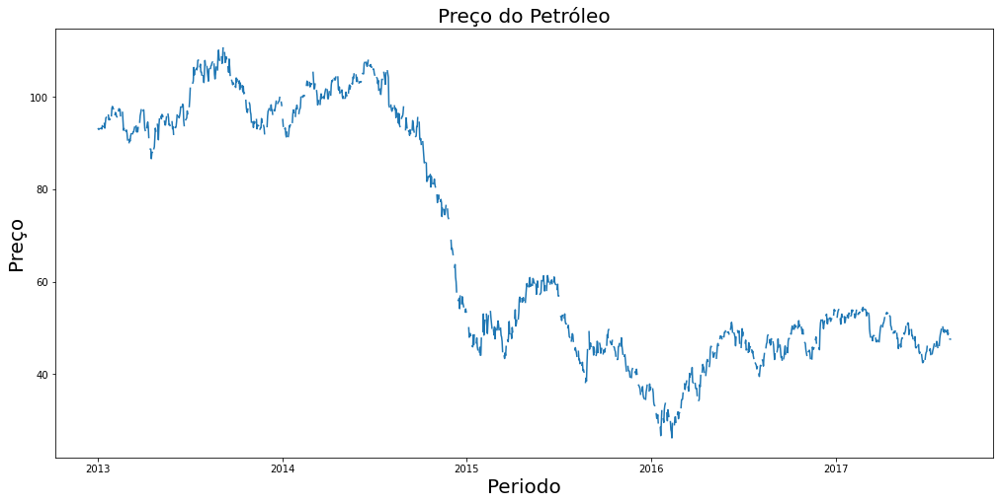

In [ ]:
x = df_null.oil_price

plt.rcParams["figure.figsize"] = (17,8)
plt.plot(x)
plt.xlabel("Periodo", size=20)  # add X-axis label
plt.ylabel("Preço", size=20)  # add Y-axis label
plt.title("Preço do Petróleo", size=20)  # add title

plt.show()

#### Sem os nulos

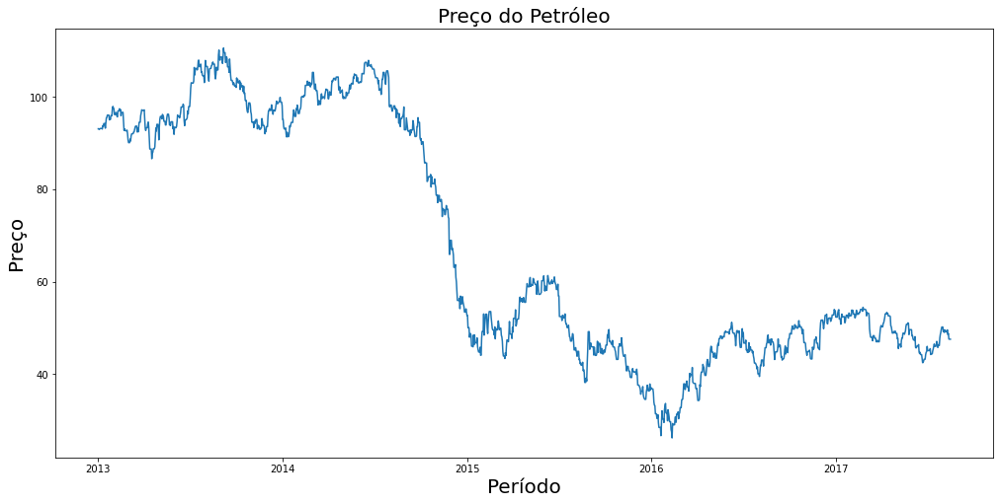

In [ ]:
x = df.oil_price

plt.rcParams["figure.figsize"] = (17,8)
plt.plot(x)
plt.xlabel("Período", size=20)
plt.ylabel("Preço", size=20)
plt.title("Preço do Petróleo", size=20)
plt.show()

In [ ]:
#venda por loja por dia
vld= df.groupby(['date','store_id','transactions','oil_price']).sales.sum().reset_index()

Correlação com preço do petróleo
sales          -0.265937
transactions    0.039787
Name: oil_price, dtype: float64 



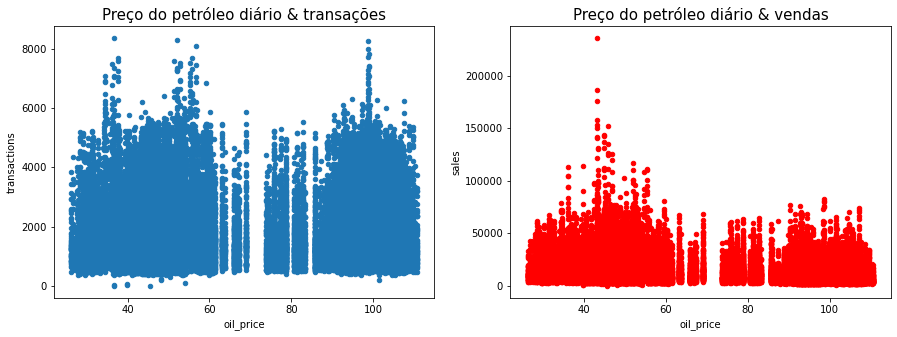

In [ ]:
temp = vld
print("Correlação com preço do petróleo")
print(temp.drop(["store_id"], axis = 1).corr("spearman").oil_price.loc[["sales", "transactions"]], "\n")


fig, axes = plt.subplots(1, 2, figsize = (15,5))
temp.plot.scatter(x = "oil_price", y = "transactions", ax=axes[0])
temp.plot.scatter(x = "oil_price", y = "sales", ax=axes[1], color = "r")
axes[0].set_title('Preço do petróleo diário & transações', fontsize = 15)
axes[1].set_title('Preço do petróleo diário & vendas', fontsize = 15);

Gráfico de correlação em linha para mostrar a tendencia

In [ ]:
#px.scatter(df, x = "oil_price", y = "sales", trendline = "ols", trendline_color_override = "red") # código alternativo

In [ ]:
#px.scatter(temp, x = "oil_price", y = "transactions", trendline = "ols", trendline_color_override = "red")

In [ ]:
df

,store_id,product_type,sales,onpromotion,oil_price,holiday_type,local,holiday_city,holiday_desc,h_transferred,sotre_city,store_state,store_type,similiar_stores,transactions,Year,Month,day,WeekOfYear,Day
date,,,,,,,,,,,,,,,,,,,,
2013-01-01,25,AUTOMOTIVE,0.000,0,93.14,Holiday,National,Ecuador,Primer dia del ano,False,Salinas,Santa Elena,D,1,770.0,2013,1,1,1,1
2013-01-01,25,BABY CARE,0.000,0,93.14,Holiday,National,Ecuador,Primer dia del ano,False,Salinas,Santa Elena,D,1,770.0,2013,1,1,1,1
2013-01-01,25,BEAUTY,2.000,0,93.14,Holiday,National,Ecuador,Primer dia del ano,False,Salinas,Santa Elena,D,1,770.0,2013,1,1,1,1
2013-01-01,25,BEVERAGES,810.000,0,93.14,Holiday,National,Ecuador,Primer dia del ano,False,Salinas,Santa Elena,D,1,770.0,2013,1,1,1,1
2013-01-01,25,BOOKS,0.000,0,93.14,Holiday,National,Ecuador,Primer dia del ano,False,Salinas,Santa Elena,D,1,770.0,2013,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-08-15,9,POULTRY,438.133,0,47.57,Holiday,Local,Riobamba,Fundacion de Riobamba,False,Quito,Pichincha,B,6,2155.0,2017,8,15,33,15
2017-08-15,9,PREPARED FOODS,154.553,1,47.57,Holiday,Local,Riobamba,Fundacion de Riobamba,False,Quito,Pichincha,B,6,2155.0,2017,8,15,33,15
2017-08-15,9,PRODUCE,2419.729,148,47.57,Holiday,Local,Riobamba,Fundacion de Riobamba,False,Quito,Pichincha,B,6,2155.0,2017,8,15,33,15


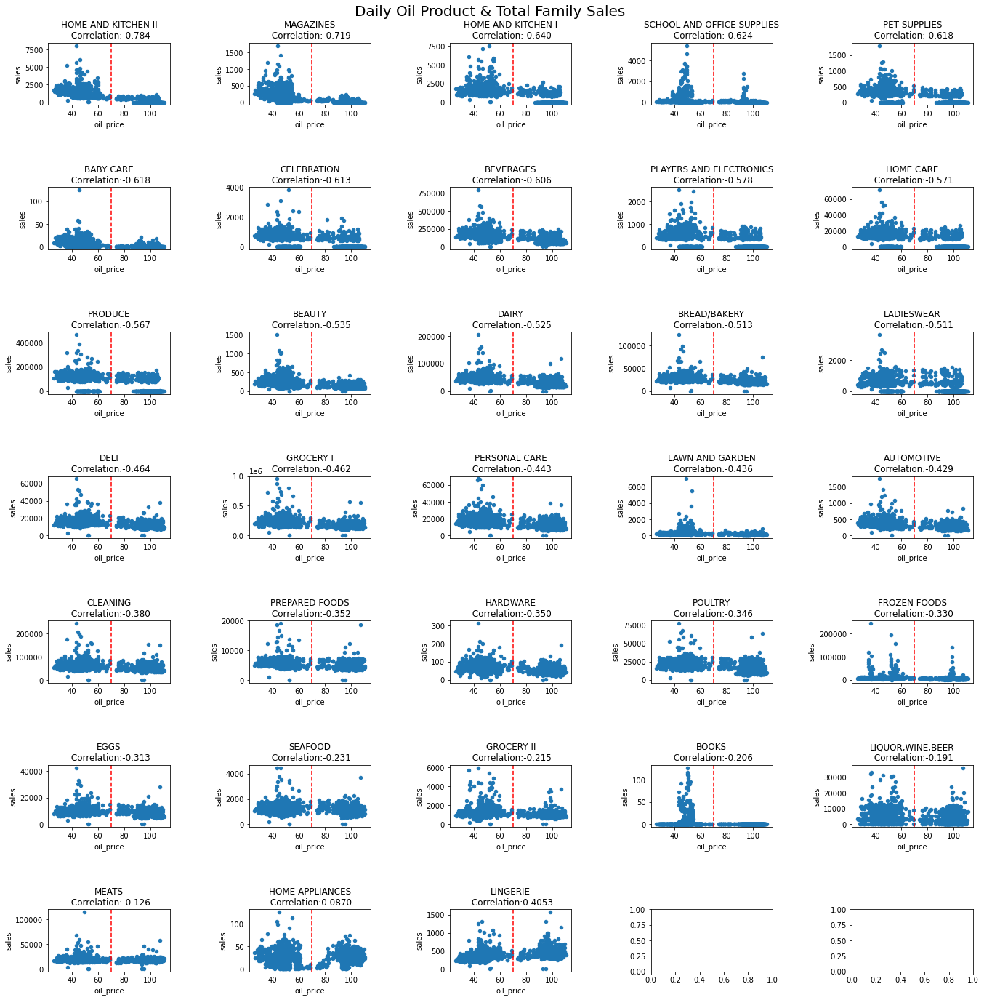

In [ ]:
import matplotlib.pyplot as plt

def plot_sales_and_oil_dependency():
    a = df.groupby(["date", "product_type",'oil_price']).sales.sum().reset_index()
    c = a.groupby("product_type").corr("spearman").reset_index()
    c = c[c.level_1 == "oil_price"][["product_type", "sales"]].sort_values("sales")


    fig, axes = plt.subplots(7, 5, figsize=(20, 20))
    for i, fam in enumerate(c.product_type):
        a[a.product_type == fam].plot.scatter(x="oil_price", y="sales", ax=axes[i // 5, i % 5])
        axes[i // 5, i % 5].set_title(fam + "\n Correlation:" + str(c[c.product_type == fam].sales.iloc[0])[:6],
                                 fontsize=12)
        axes[i // 5, i % 5].axvline(x=70, color='r', linestyle='--')

    plt.tight_layout(pad=5)
    plt.suptitle("Daily Oil Product & Total Family Sales \n", fontsize=20)
    plt.show()

plot_sales_and_oil_dependency()


Pode-se verificar pelas figuras acimas que a correlação entre as vendas e o preço do petróleo é inversamente proporcional, ou seja, quando aumenta o preço do petróleo, as vendas tendem a baixar. Isso pode deve-se ao facto do Equador ser um país altamente dependente do Pétroleo (Link: https://www.bmz.de/en/countries/ecuador/economic-situation-51990)

<h2>product_type</h2>

In [ ]:
a = df.groupby("product_type").sales.mean().sort_values(ascending = False).reset_index()
px.bar(a, y = "product_type", x="sales", title = "Vendas por tipo de produto")

Podemos ver que Grocery é a categoria que mais receita gera e Books é a que menosreceita gera.

In [ ]:
ddf= df.groupby(['store_id', 'product_type']).sales.sum().reset_index()

In [ ]:
ddf[ddf.sales == 0]

,store_id,product_type,sales
1,1,BABY CARE,0.0
268,9,BOOKS,0.0
301,10,BOOKS,0.0
334,11,BOOKS,0.0
367,12,BOOKS,0.0
397,13,BABY CARE,0.0
400,13,BOOKS,0.0
433,14,BOOKS,0.0
449,14,LAWN AND GARDEN,0.0
466,15,BOOKS,0.0


No entanto, algumas lojas não vendem alguns produtos

In [ ]:
df.loc[(df["sales"]==0) | (df["transactions"].isna()), "transactions"] = 0.0

<h2>store_type</h2>

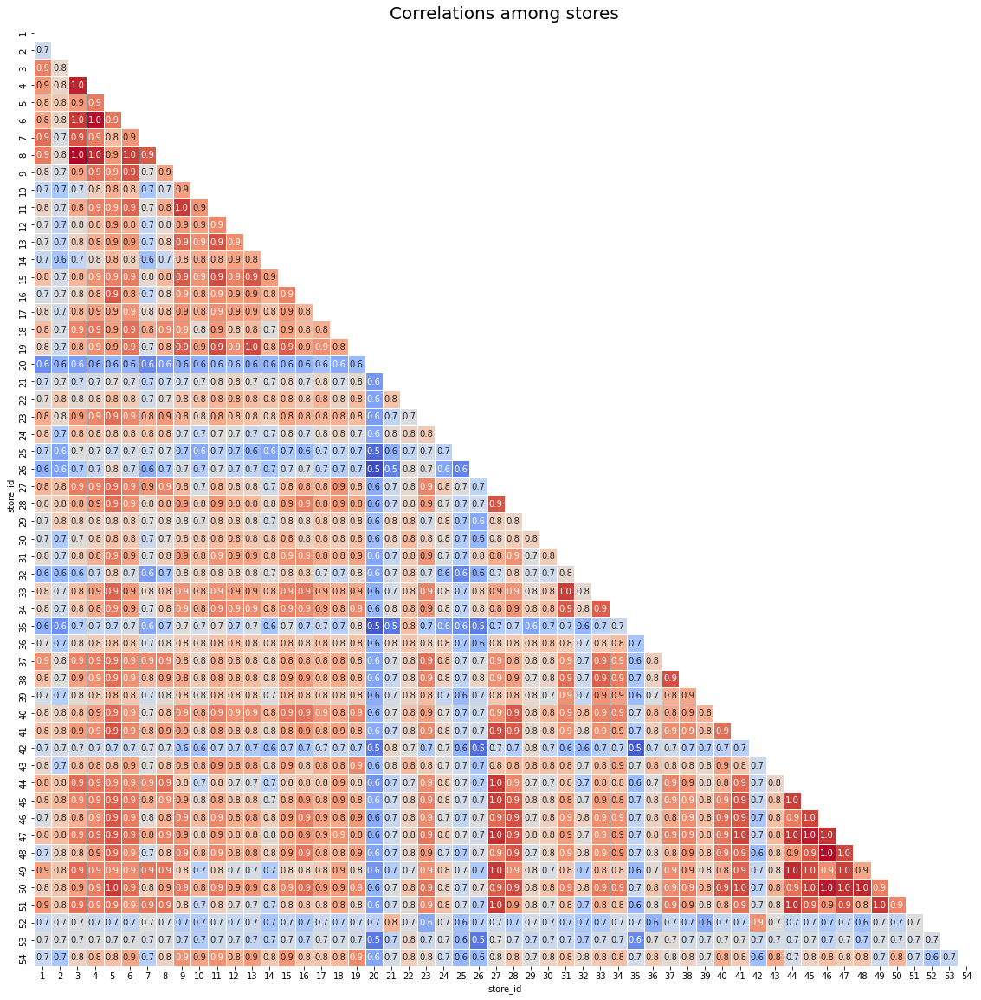

In [ ]:
a = df[["store_id", "sales"]]
a["ind"] = 1
a["ind"] = a.groupby("store_id").ind.cumsum().values
a = pd.pivot(a, index = "ind", columns = "store_id", values = "sales").corr()
mask = np.triu(a.corr())
plt.figure(figsize=(20, 20))
sns.heatmap(a,
        annot=True,
        fmt='.1f',
        cmap='coolwarm',
        square=True,
        mask=mask,
        linewidths=1,
        cbar=False)
plt.title("Correlations among stores",fontsize = 20)
plt.show()

Pode-se verificar pelo gráfico que as lojas 20, 21, 25, 26, 35, 42, 52 e 53 são as que mais diferentes são das restantes

In [ ]:
df

,store_id,product_type,sales,onpromotion,oil_price,holiday_type,local,holiday_city,holiday_desc,h_transferred,sotre_city,store_state,store_type,similiar_stores,transactions,Year,Month,day,WeekOfYear,Day
date,,,,,,,,,,,,,,,,,,,,
2013-01-01,25,AUTOMOTIVE,0.000,0,93.14,Holiday,National,Ecuador,Primer dia del ano,False,Salinas,Santa Elena,D,1,0.0,2013,1,1,1,1
2013-01-01,25,BABY CARE,0.000,0,93.14,Holiday,National,Ecuador,Primer dia del ano,False,Salinas,Santa Elena,D,1,0.0,2013,1,1,1,1
2013-01-01,25,BEAUTY,2.000,0,93.14,Holiday,National,Ecuador,Primer dia del ano,False,Salinas,Santa Elena,D,1,770.0,2013,1,1,1,1
2013-01-01,25,BEVERAGES,810.000,0,93.14,Holiday,National,Ecuador,Primer dia del ano,False,Salinas,Santa Elena,D,1,770.0,2013,1,1,1,1
2013-01-01,25,BOOKS,0.000,0,93.14,Holiday,National,Ecuador,Primer dia del ano,False,Salinas,Santa Elena,D,1,0.0,2013,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-08-15,9,POULTRY,438.133,0,47.57,Holiday,Local,Riobamba,Fundacion de Riobamba,False,Quito,Pichincha,B,6,2155.0,2017,8,15,33,15
2017-08-15,9,PREPARED FOODS,154.553,1,47.57,Holiday,Local,Riobamba,Fundacion de Riobamba,False,Quito,Pichincha,B,6,2155.0,2017,8,15,33,15
2017-08-15,9,PRODUCE,2419.729,148,47.57,Holiday,Local,Riobamba,Fundacion de Riobamba,False,Quito,Pichincha,B,6,2155.0,2017,8,15,33,15


## Sales e Transactions

In [ ]:
#as imagens não estão a ser salvas depois de guardar o notebook
import plotly.express as px
temp = df.groupby('store_id').resample('D').sales.sum().reset_index()
px.line(temp, x='date', y='sales', color = 'store_id',
        title='Vendas Diária das lojas')

In [ ]:
#as imagens não estão a ser salvas depois de guardar o notebook
a = df.resample("M").sales.mean().reset_index()
a["Year"] = a.date.dt.year
px.line(a, x='date', y='sales', color='Year',title = "Média de vendas por mês" )

#### Analisando a figura acima pode-se verificar que o final de cada ano é o periodo com mais vendas do ano.

In [ ]:
a

,date,sales,Year
0,2013-01-31,226.617180,2013
1,2013-02-28,227.248254,2013
2,2013-03-31,242.859812,2013
3,2013-04-30,241.402388,2013
4,2013-05-31,242.780030,2013
5,2013-06-30,248.211342,2013
6,2013-07-31,238.003653,2013
7,2013-08-31,244.125308,2013
8,2013-09-30,253.447953,2013
9,2013-10-31,244.912135,2013


In [ ]:
df.corr('spearman').sales.loc['onpromotion']

0.5337343683557025

In [ ]:
import plotly.express as px
temp = df.groupby('store_id').resample('D').transactions.sum().reset_index()
px.line(temp, x='date', y='transactions', color='store_id',
        title='Transações Diária das lojas')

In [ ]:
a = df.resample("M").transactions.mean().reset_index()
a["Year"] = a.date.dt.year
px.line(a, x='date', y='transactions', color='Year',title = "Média de transações por mês" )

A verificação feita acima sobre o periodo final do ano influenciar na receita das lojas é mais visivel neste na imagem acima. Essa relação, também representada na célula abaixo (correlação), deve-se ao facto das vendas aumentarem a cada transação. Ou seja, sempre que existe uma transação o valor da soma da venda das lojas também aumenta.

In [ ]:
df.corr('spearman').sales.loc['transactions']

0.6467657112485629

In [ ]:
print('Correlação - sales e oil_price:',df.corr('spearman').sales.loc['oil_price'])

Correlação - sales e oil_price: -0.13170520271283154


In [ ]:
print('Depois de agruparmos os dados por dia, por total de vendas, por loja, por dia:')
#venda_loja_dia (vld)
vld= df.groupby(['date','store_id','transactions','oil_price']).sales.sum().reset_index()
print('Correlação - sales e transactions:', vld.corr("spearman").sales.loc["transactions"])
print('Correlação - sales e oil_price:', vld.corr("spearman").sales.loc["oil_price"].mean())

Depois de agruparmos os dados por dia, por total de vendas, por loja, por dia:
Correlação - sales e transactions: 0.9727385665225219
Correlação - sales e oil_price: -0.07135073820772896


In [ ]:
vld.head(10)

,date,store_id,transactions,oil_price,sales
0,2013-01-01,25,0.0,93.14,0.000000
1,2013-01-01,25,770.0,93.14,2511.618999
2,2013-01-02,1,0.0,93.14,0.000000
3,2013-01-02,1,2111.0,93.14,7417.148000
4,2013-01-02,2,0.0,93.14,0.000000
5,2013-01-02,2,2358.0,93.14,10266.718981
6,2013-01-02,3,0.0,93.14,0.000000
7,2013-01-02,3,3487.0,93.14,24060.348000
8,2013-01-02,4,0.0,93.14,0.000000
9,2013-01-02,4,1922.0,93.14,10200.083980


In [ ]:
#vendas por dia (vd)
vd=df.groupby('date')['sales','onpromotion'].sum()
#dds=df.groupby('date')['oil_price'].mean()

In [ ]:
#ds2=temp.merge(ds, how='inner', on='date')
#ds2
vd

,sales,onpromotion
date,,
2013-01-01,2511.618999,0
2013-01-02,496092.417944,0
2013-01-03,361461.231124,0
2013-01-04,354459.677093,0
2013-01-05,477350.121229,0
...,...,...
2017-08-11,826373.722022,14179
2017-08-12,792630.535079,8312
2017-08-13,865639.677471,9283


In [ ]:
vld = vd.drop(columns = 'sales').merge(vld, how='inner', on='date')

In [ ]:
vld

,date,onpromotion,store_id,transactions,oil_price,sales
0,2013-01-01,0,25,0.0,93.14,0.000000
1,2013-01-01,0,25,770.0,93.14,2511.618999
2,2013-01-02,0,1,0.0,93.14,0.000000
3,2013-01-02,0,1,2111.0,93.14,7417.148000
4,2013-01-02,0,2,0.0,93.14,0.000000
...,...,...,...,...,...,...
166861,2017-08-15,10605,52,2255.0,47.57,18600.046000
166862,2017-08-15,10605,53,0.0,47.57,0.000000
166863,2017-08-15,10605,53,932.0,47.57,8208.189000
166864,2017-08-15,10605,54,0.0,47.57,0.000000


In [ ]:
#vendas por dia
ds=df.groupby('date')['sales', 'onpromotion', 'transactions'].sum()
dds=df.groupby('date')['oil_price'].mean()

In [ ]:
dsw=ds.merge(dds, how='inner', on='date')

In [ ]:
dsw

,sales,onpromotion,transactions,oil_price
date,,,,
2013-01-01,2511.618999,0,13090.0,93.14
2013-01-02,496092.417944,0,1774175.0,93.14
2013-01-03,361461.231124,0,1474026.0,92.97
2013-01-04,354459.677093,0,1494513.0,93.12
2013-01-05,477350.121229,0,1809160.0,93.20
...,...,...,...,...
2017-08-11,826373.722022,14179,2601503.0,48.81
2017-08-12,792630.535079,8312,2597161.0,47.59
2017-08-13,865639.677471,9283,2501738.0,47.59


In [ ]:
dsw['Year'] = dsw.index.year
dsw['Month'] = dsw.index.month
dsw['Day'] = dsw.index.day
dsw['WeekOfYear'] = dsw.index.weekofyear

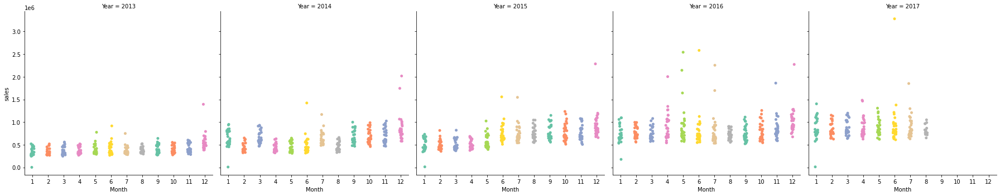

In [ ]:
sns.factorplot(data = dsw, x = 'Month', y = 'sales',
               palette = 'Set2',
               col = 'Year',
               )

Pode-se analisar que a crise económica no setor petrolifero em 2015, teve um grande impacto no que toca às vendas. O poder de compra do moradores do Equador aumentou e isso traduz-se nesta variável.
https://economia.uol.com.br/noticias/bloomberg/2015/08/25/equador-queda-do-petroleo-manifestacoes-el-nino-acrescente-um-vulcao-em-atividade.htm

Existe também um grande aumento das sales a partir de Abril de 2016.
Que coincide com o periodo em que começaram a haver terramotos no Equador.
https://g1.globo.com/mundo/noticia/2016/04/costa-do-equador-e-atingida-por-terremoto-de-magnitude-78.html

Faz sentido que as vendas disparem nesse periodo porque as pessoas sentem uma maior necessidade de armazenamento de produtos.

In [ ]:
df0 = df.reset_index()
df0[1753950:1960727].holiday_desc

1753950          not_a_holiday
1753951          not_a_holiday
1753952          not_a_holiday
1753953          not_a_holiday
1753954          not_a_holiday
                  ...         
1960722    Terremoto Manabi+14
1960723    Terremoto Manabi+14
1960724    Terremoto Manabi+14
1960725    Terremoto Manabi+14
1960726    Terremoto Manabi+14
Name: holiday_desc, Length: 206777, dtype: object

In [ ]:
df0[df0.holiday_desc == 'Terremoto Manabi+1'].head(1)

,date,store_id,product_type,sales,onpromotion,oil_price,holiday_type,local,holiday_city,holiday_desc,...,sotre_city,store_state,store_type,similiar_stores,transactions,Year,Month,day,WeekOfYear,Day
1934493,2016-04-17,1,AUTOMOTIVE,1.0,0,39.74,Event,National,Ecuador,Terremoto Manabi+1,...,Quito,Pichincha,D,13,575.0,2016,4,17,15,17


In [ ]:
df[(df.Month.isin([4,5]))].groupby(["Year"]).sales.mean()

Year
2013    242.118992
2014    281.779915
2015    331.038693
2016    480.872793
2017    487.580540
Name: sales, dtype: float64

In [ ]:
pd.pivot_table(df[(df.Month.isin([3]))], index="Year", columns="product_type", values="sales", aggfunc="mean")

product_type,AUTOMOTIVE,BABY CARE,BEAUTY,BEVERAGES,BOOKS,BREAD/BAKERY,CELEBRATION,CLEANING,DAIRY,DELI,...,MAGAZINES,MEATS,PERSONAL CARE,PET SUPPLIES,PLAYERS AND ELECTRONICS,POULTRY,PREPARED FOODS,PRODUCE,SCHOOL AND OFFICE SUPPLIES,SEAFOOD
Year,,,,,,,,,,,,,,,,,,,,,
2013,5.354137,0.000000,2.735624,1277.854137,0.000000,416.567182,0.000000,1055.673212,429.528752,229.493304,...,0.000000,368.536706,223.880785,0.000000,0.000000,223.562034,106.077344,2.830996,0.000000,28.104719
2014,6.945742,0.049451,3.547390,3041.271978,0.000000,447.037294,14.745879,1215.532967,815.422390,261.380974,...,1.343407,382.691629,265.849588,5.499313,11.019918,449.305728,112.448241,2301.416229,1.535027,27.463680
2015,7.556573,0.000000,2.778940,1517.353826,0.000000,548.149512,0.000000,1220.856769,807.620013,330.042844,...,0.000000,357.434375,317.030739,0.000000,0.000000,421.435399,104.726475,4.516024,0.000000,28.651716
2016,7.347959,0.269348,4.346740,3027.187690,0.000000,502.558584,14.251066,1079.034126,860.365631,278.150487,...,6.079829,331.172669,296.834247,5.897014,8.730043,375.423661,109.989251,2307.625455,1.960999,23.921273
2017,7.786975,0.269020,4.291540,3733.142422,0.287279,584.240509,14.210590,1220.105295,991.143031,326.487579,...,6.278150,374.282124,331.434571,8.790627,11.391357,395.345107,114.028329,2442.188862,5.018868,25.536811


In [ ]:
pd.pivot_table(df[(df.Month.isin([4]))], index="Year", columns="product_type", values="sales", aggfunc="mean")

product_type,AUTOMOTIVE,BABY CARE,BEAUTY,BEVERAGES,BOOKS,BREAD/BAKERY,CELEBRATION,CLEANING,DAIRY,DELI,...,MAGAZINES,MEATS,PERSONAL CARE,PET SUPPLIES,PLAYERS AND ELECTRONICS,POULTRY,PREPARED FOODS,PRODUCE,SCHOOL AND OFFICE SUPPLIES,SEAFOOD
Year,,,,,,,,,,,,,,,,,,,,,
2013,5.423913,0.000000,2.659420,1263.131159,0.000000,412.045811,0.000000,1029.873913,405.500000,229.104137,...,0.000000,377.661710,236.625362,0.000000,0.000000,221.188785,95.022953,4.571014,0.000000,24.854641
2014,6.048816,0.000000,2.784637,1516.959799,0.000000,411.498501,0.000000,1042.522613,788.743001,250.284672,...,0.000000,351.924660,262.272075,0.000000,0.000000,403.811275,107.631970,5.134243,0.000000,22.912587
2015,6.154422,0.000000,2.719728,1569.487755,0.000000,544.131441,0.000000,1245.188435,803.523810,326.683434,...,1.482993,355.309035,309.641497,0.000000,0.000000,411.022769,105.217769,4.872789,0.000000,27.199640
2016,7.280584,0.230067,5.173463,3595.672550,0.000000,535.661955,14.331102,1249.368229,891.309191,297.261287,...,6.970785,365.151245,398.223981,6.833841,11.741327,403.056444,110.073022,2258.833679,5.661595,24.509284
2017,8.259976,0.188029,4.672914,3693.429262,0.163845,545.734599,14.094921,1251.807739,972.517533,322.490491,...,7.162636,355.896850,339.880895,9.172914,12.386941,376.620920,102.544977,2331.079168,17.788996,22.905171


In [ ]:
pd.pivot_table(df[(df.Month.isin([5]))], index="Year", columns="product_type", values="sales", aggfunc="mean")

product_type,AUTOMOTIVE,BABY CARE,BEAUTY,BEVERAGES,BOOKS,BREAD/BAKERY,CELEBRATION,CLEANING,DAIRY,DELI,...,MAGAZINES,MEATS,PERSONAL CARE,PET SUPPLIES,PLAYERS AND ELECTRONICS,POULTRY,PREPARED FOODS,PRODUCE,SCHOOL AND OFFICE SUPPLIES,SEAFOOD
Year,,,,,,,,,,,,,,,,,,,,,
2013,6.212567,0.000000,2.572193,1266.002005,0.0000,426.650093,0.000000,1022.639706,411.411765,240.923805,...,0.000000,375.490570,213.630348,0.000000,0.000000,222.951180,98.312784,6.531417,0.000000,25.768878
2014,5.650805,0.000000,2.534640,1456.807558,0.0000,435.048621,0.000000,1048.526242,770.820154,265.244097,...,0.000000,383.199043,279.444367,0.000000,0.000000,420.298471,102.880901,6.363891,0.000000,25.121084
2015,6.129435,0.000000,3.312746,2322.010512,0.0000,579.838640,0.000000,1258.019054,849.742444,345.382056,...,1.944809,388.759461,330.965177,0.122208,0.000000,435.634653,103.655742,6.683311,0.000000,27.928273
2016,7.342857,0.288410,4.748248,3252.790296,0.0000,575.319851,14.149865,1211.418329,947.561186,306.415172,...,6.990296,363.864786,344.437736,7.037736,9.968733,399.311664,108.396290,2353.376228,7.236658,24.560516
2017,7.059737,0.166667,5.900239,3487.099761,0.0908,566.843280,13.338112,1352.649940,966.421147,322.572431,...,6.640980,367.788181,310.506571,8.976703,12.050777,392.489781,91.215556,2460.593033,5.769415,23.695576


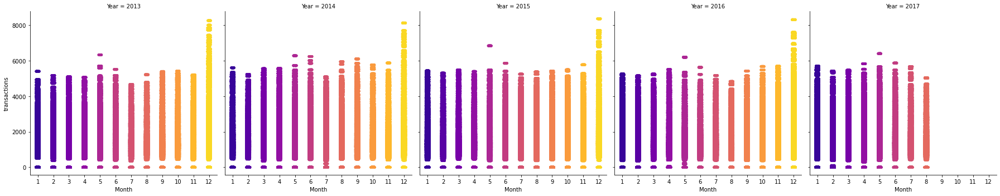

In [ ]:
sns.factorplot(data = df, x = 'Month', y = 'transactions',
               palette = 'plasma',
               col = 'Year',
               )

In [ ]:
ds

,sales,onpromotion,transactions
date,,,
2013-01-01,2511.618999,0,13090.0
2013-01-02,496092.417944,0,1774175.0
2013-01-03,361461.231124,0,1474026.0
2013-01-04,354459.677093,0,1494513.0
2013-01-05,477350.121229,0,1809160.0
...,...,...,...
2017-08-11,826373.722022,14179,2601503.0
2017-08-12,792630.535079,8312,2597161.0
2017-08-13,865639.677471,9283,2501738.0


In [ ]:
sns.set(style="ticks")
c = '#386B7F'
plt.figure(figsize=(12,6))

<Figure size 864x432 with 0 Axes>

<Figure size 864x432 with 0 Axes>

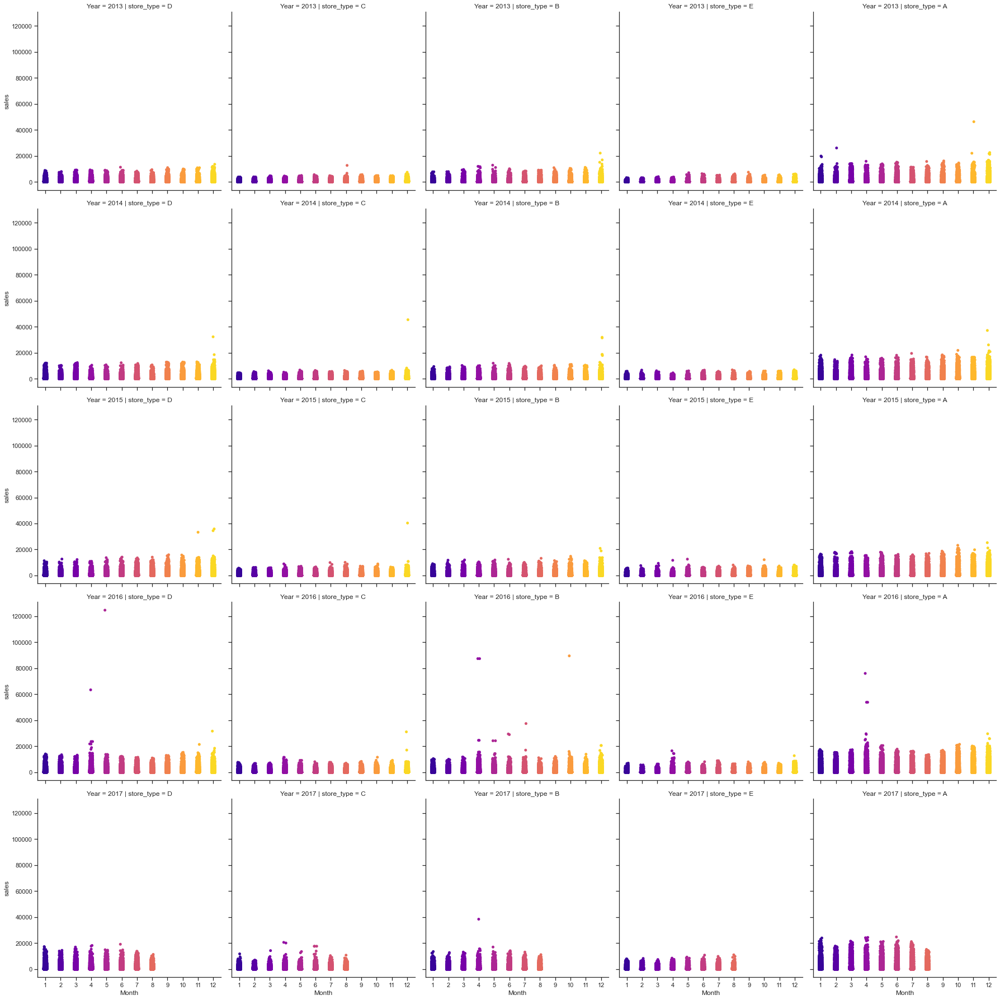

In [ ]:
sns.factorplot(data = df, x = 'Month', y = 'sales',
               col = 'store_type',
               palette = 'plasma',
               row = 'Year',
               )

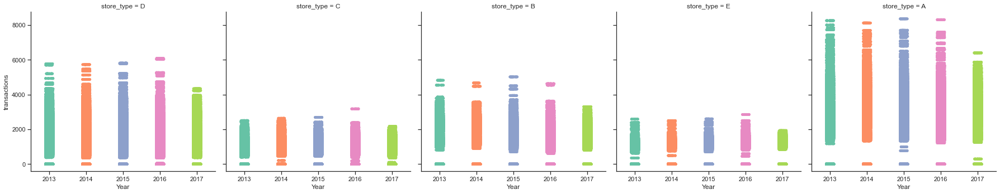

In [ ]:
sns.factorplot(data = df, x = 'Year', y = 'transactions',
               col = 'store_type',
               palette = 'Set2'
               )

In [ ]:
df.isnull().sum()

store_id           0
product_type       0
sales              0
onpromotion        0
oil_price          0
holiday_type       0
local              0
holiday_city       0
holiday_desc       0
h_transferred      0
sotre_city         0
store_state        0
store_type         0
similiar_stores    0
transactions       0
Year               0
Month              0
day                0
WeekOfYear         0
Day                0
dtype: int64

In [ ]:
df.holiday_type.value_counts()

not_a_holiday    2346168
Holiday           273504
Event              94248
Additional         63063
Transfer           15444
Work Day            7920
Bridge              4884
Name: holiday_type, dtype: int64

In [ ]:
# analisar se existe correlação entre sales e transactions, assim como calcular o nº de transactions per sales
# analisar se existe correlação entre mais sales e onpromotion, se com promoções as lojas vendem mais
# analisar se existe correlação entre sales e oil_price

In [ ]:
dfa=df[df['store_type']=='A']
dfa=dfa.groupby('date')['sales', 'onpromotion','transactions']
dfa=dfa.sum()
dfb=df[df['store_type']=='B']
dfb=dfb.groupby('date')['sales', 'onpromotion', 'transactions']
dfb=dfb.sum()
dfc=df[df['store_type']=='C']
dfc=dfc.groupby('date')['sales', 'onpromotion', 'transactions']
dfc=dfc.sum()
dfd=df[df['store_type']=='D']
dfd=dfd.groupby('date')['sales', 'onpromotion', 'transactions']
dfd=dfd.sum()
dfe=df[df['store_type']=='E']
dfe=dfe.groupby('date')['sales', 'onpromotion', 'transactions']
dfe=dfe.sum()

In [ ]:
dfa['Year'] = dfa.index.year
dfa['Month'] = dfa.index.month
dfa['Day'] = dfa.index.day
dfa['WeekOfYear'] = dfa.index.weekofyear

In [ ]:
dfd['Year'] = dfd.index.year
dfd['Month'] = dfd.index.month
dfd['Day'] = dfd.index.day
dfd['WeekOfYear'] = dfd.index.weekofyear

In [ ]:
dfb['Year'] = dfb.index.year
dfb['Month'] = dfb.index.month
dfb['Day'] = dfb.index.day
dfb['WeekOfYear'] = dfb.index.weekofyear

In [ ]:
dfc['Year'] = dfc.index.year
dfc['Month'] = dfc.index.month
dfc['Day'] = dfc.index.day
dfc['WeekOfYear'] = dfc.index.weekofyear

In [ ]:
dfe['Year'] = dfe.index.year
dfe['Month'] = dfe.index.month
dfe['Day'] = dfe.index.day
dfe['WeekOfYear'] = dfe.index.weekofyear

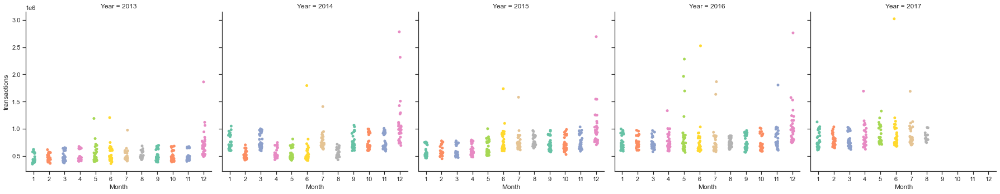

In [ ]:
sns.factorplot(data = dfa, x = 'Month', y = 'transactions',
               col='Year',
               palette = 'Set2'
               )

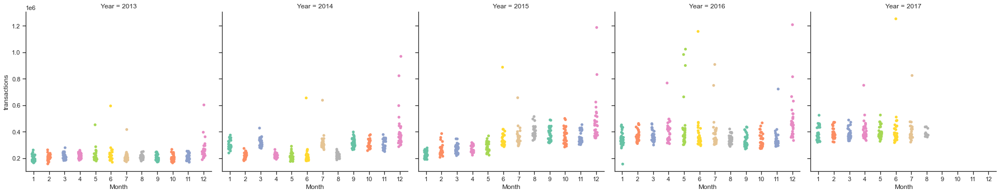

In [ ]:
sns.factorplot(data = dfb, x = 'Month', y = 'transactions',
               col='Year',
               palette = 'Set2'
               )

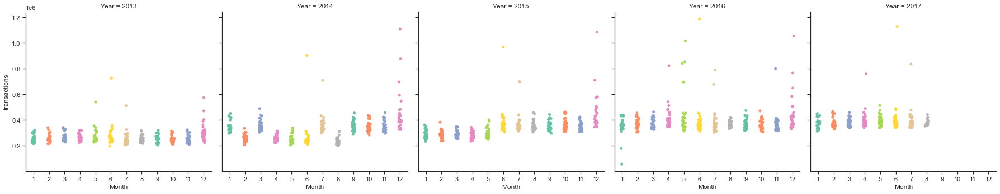

In [ ]:
sns.factorplot(data = dfc, x = 'Month', y = 'transactions',
               col='Year',
               palette = 'Set2'
               )

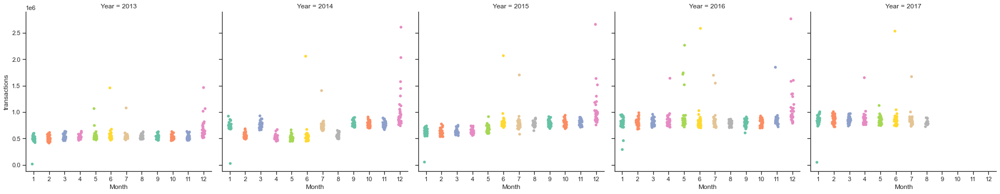

In [ ]:
sns.factorplot(data = dfd, x = 'Month', y = 'transactions',
               col='Year',
               palette = 'Set2'
               )

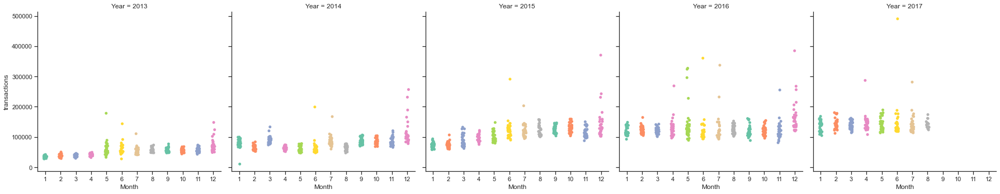

In [ ]:
sns.factorplot(data = dfe, x = 'Month', y = 'transactions',
               col='Year',
               palette = 'Set2'
               )

# Comportamento por loja, sazonalidade e previsões


                 Forecast
2015-05-31            NaN
2015-06-30            NaN
2015-07-31            NaN
2015-08-31            NaN
2015-09-30            NaN
2015-10-31            NaN
2015-11-30            NaN
2015-12-31            NaN
2016-01-31            NaN
2016-02-29            NaN
2016-03-31            NaN
2016-04-30            NaN
2016-05-31            NaN
2016-06-30            NaN
2016-07-31            NaN
2016-08-31            NaN
2016-09-30            NaN
2016-10-31            NaN
2016-11-30            NaN
2016-12-31            NaN
2017-01-31            NaN
2017-02-28            NaN
2017-03-31            NaN
2017-04-30            NaN
2017-05-31            NaN
2017-06-30            NaN
2017-07-31            NaN
2017-08-31            NaN
2017-09-30   91794.443008
2017-10-31   82726.738960
2017-11-30  126884.369199
2017-12-31  184335.978700
2018-01-31  191534.871140
2018-02-28  114418.875007
2018-03-31  102868.046025
2018-04-30  107220.261044
2018-05-31   90990.283960
2018-06-30  

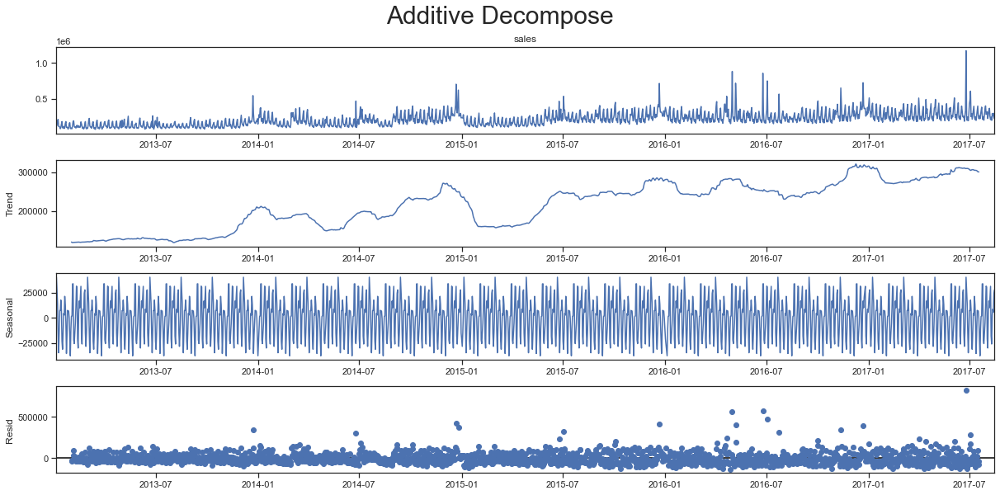

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
dfaa=dfa.drop(columns=['onpromotion','transactions','Year','Month','Day','WeekOfYear'])
decompose_data = seasonal_decompose(dfaa.sales, model="additive", filt=None, two_sided=True, extrapolate_trend=0, period=56)
# period 56 because 56 months

decompose_data.plot().suptitle('Additive Decompose', fontsize=30, y=1.04)
# Use the decomposed components to make a forecast for future data
forecast = decompose_data.trend + decompose_data.seasonal + decompose_data.resid
future_dates = pd.date_range(start='2015-05-01', periods=56, freq='M')
future_forecast = pd.DataFrame(data=forecast[:56].values, index=future_dates, columns=['Forecast'])

# Print the forecast for future data
print(future_forecast)



                Forecast
2015-05-31           NaN
2015-06-30           NaN
2015-07-31           NaN
2015-08-31           NaN
2015-09-30           NaN
2015-10-31           NaN
2015-11-30           NaN
2015-12-31           NaN
2016-01-31           NaN
2016-02-29           NaN
2016-03-31           NaN
2016-04-30           NaN
2016-05-31           NaN
2016-06-30           NaN
2016-07-31           NaN
2016-08-31           NaN
2016-09-30           NaN
2016-10-31           NaN
2016-11-30           NaN
2016-12-31           NaN
2017-01-31           NaN
2017-02-28           NaN
2017-03-31           NaN
2017-04-30           NaN
2017-05-31           NaN
2017-06-30           NaN
2017-07-31           NaN
2017-08-31           NaN
2017-09-30  31954.550020
2017-10-31  38141.411997
2017-11-30  45758.680000
2017-12-31  67737.338001
2018-01-31  63472.413000
2018-02-28  46775.281980
2018-03-31  47115.830011
2018-04-30  38348.771002
2018-05-31  41492.508020
2018-06-30  40978.265000
2018-07-31  52982.996974


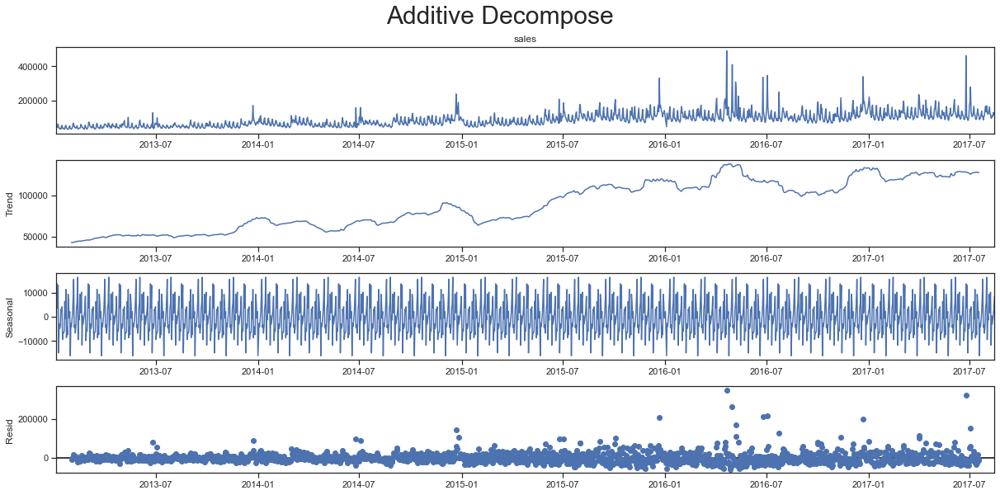

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
dfbb=dfb.drop(columns=['onpromotion','transactions','Year','Month','Day','WeekOfYear'])
decompose_data = seasonal_decompose(dfbb.sales, model="additive", filt=None, two_sided=True, extrapolate_trend=0, period=56)
# period 56 because 56 months

decompose_data.plot().suptitle('Additive Decompose', fontsize=30, y=1.04)
# Use the decomposed components to make a forecast for future data
forecast = decompose_data.trend + decompose_data.seasonal + decompose_data.resid
future_dates = pd.date_range(start='2015-05-01', periods=56, freq='M')
future_forecast = pd.DataFrame(data=forecast[:56].values, index=future_dates, columns=['Forecast'])

# Print the forecast for future data
print(future_forecast)

                Forecast
2015-05-31           NaN
2015-06-30           NaN
2015-07-31           NaN
2015-08-31           NaN
2015-09-30           NaN
2015-10-31           NaN
2015-11-30           NaN
2015-12-31           NaN
2016-01-31           NaN
2016-02-29           NaN
2016-03-31           NaN
2016-04-30           NaN
2016-05-31           NaN
2016-06-30           NaN
2016-07-31           NaN
2016-08-31           NaN
2016-09-30           NaN
2016-10-31           NaN
2016-11-30           NaN
2016-12-31           NaN
2017-01-31           NaN
2017-02-28           NaN
2017-03-31           NaN
2017-04-30           NaN
2017-05-31           NaN
2017-06-30           NaN
2017-07-31           NaN
2017-08-31           NaN
2017-09-30  46131.971009
2017-10-31  48233.718000
2017-11-30  56835.422009
2017-12-31  87686.491001
2018-01-31  71460.976026
2018-02-28  62105.172002
2018-03-31  58644.823012
2018-04-30  50717.317008
2018-05-31  49909.640982
2018-06-30  55708.301025
2018-07-31  76015.980992


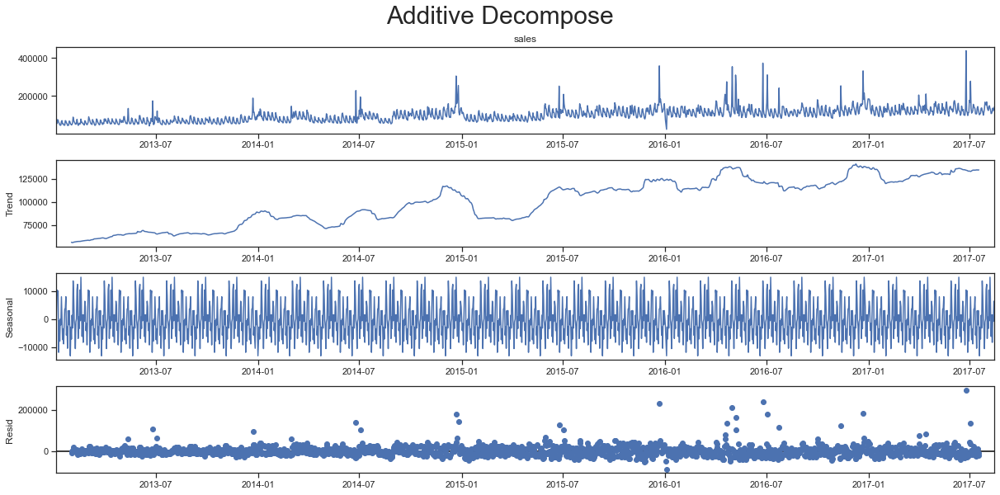

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
dfcc=dfc.drop(columns=['onpromotion','transactions','Year','Month','Day','WeekOfYear'])
decompose_data = seasonal_decompose(dfcc.sales, model="additive", filt=None, two_sided=True, extrapolate_trend=0, period=56)
# period 56 because 56 months
decompose_data.plot().suptitle('Additive Decompose', fontsize=30, y=1.04)
# Use the decomposed components to make a forecast for future data
forecast = decompose_data.trend + decompose_data.seasonal + decompose_data.resid
future_dates = pd.date_range(start='2015-05-01', periods=56, freq='M')
future_forecast = pd.DataFrame(data=forecast[:56].values, index=future_dates, columns=['Forecast'])

# Print the forecast for future data
print(future_forecast)

                 Forecast
2015-05-31            NaN
2015-06-30            NaN
2015-07-31            NaN
2015-08-31            NaN
2015-09-30            NaN
2015-10-31            NaN
2015-11-30            NaN
2015-12-31            NaN
2016-01-31            NaN
2016-02-29            NaN
2016-03-31            NaN
2016-04-30            NaN
2016-05-31            NaN
2016-06-30            NaN
2016-07-31            NaN
2016-08-31            NaN
2016-09-30            NaN
2016-10-31            NaN
2016-11-30            NaN
2016-12-31            NaN
2017-01-31            NaN
2017-02-28            NaN
2017-03-31            NaN
2017-04-30            NaN
2017-05-31            NaN
2017-06-30            NaN
2017-07-31            NaN
2017-08-31            NaN
2017-09-30   91282.948002
2017-10-31  104209.714015
2017-11-30   94328.115040
2017-12-31  129708.729058
2018-01-31  166977.997003
2018-02-28  147366.790004
2018-03-31  111899.473028
2018-04-30  104831.280082
2018-05-31  117770.522095
2018-06-30  

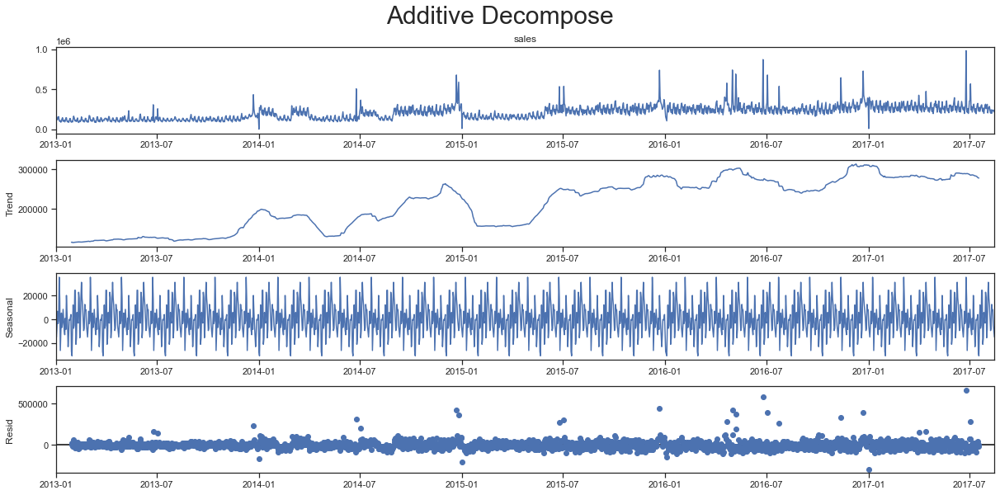

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
dfdd=dfd.drop(columns=['onpromotion', 'transactions','Year','Month','Day','WeekOfYear'])
decompose_data = seasonal_decompose(dfdd.sales, model="additive", filt=None, two_sided=True, extrapolate_trend=0, period=56)
# period 56 because 56 months
decompose_data.plot().suptitle('Additive Decompose', fontsize=30, y=1.04)
# Use the decomposed components to make a forecast for future data
forecast = decompose_data.trend + decompose_data.seasonal + decompose_data.resid
future_dates = pd.date_range(start='2015-05-01', periods=56, freq='M')
future_forecast = pd.DataFrame(data=forecast[:56].values, index=future_dates, columns=['Forecast'])

# Print the forecast for future data
print(future_forecast)

                Forecast
2015-05-31           NaN
2015-06-30           NaN
2015-07-31           NaN
2015-08-31           NaN
2015-09-30           NaN
2015-10-31           NaN
2015-11-30           NaN
2015-12-31           NaN
2016-01-31           NaN
2016-02-29           NaN
2016-03-31           NaN
2016-04-30           NaN
2016-05-31           NaN
2016-06-30           NaN
2016-07-31           NaN
2016-08-31           NaN
2016-09-30           NaN
2016-10-31           NaN
2016-11-30           NaN
2016-12-31           NaN
2017-01-31           NaN
2017-02-28           NaN
2017-03-31           NaN
2017-04-30           NaN
2017-05-31           NaN
2017-06-30           NaN
2017-07-31           NaN
2017-08-31           NaN
2017-09-30   6970.449000
2017-10-31   7824.233999
2017-11-30  10214.855000
2017-12-31  12149.658000
2018-01-31  12501.770010
2018-02-28   9109.913000
2018-03-31   7785.860000
2018-04-30   7481.306000
2018-05-31   9023.971992
2018-06-30   9151.140000
2018-07-31  12139.906004


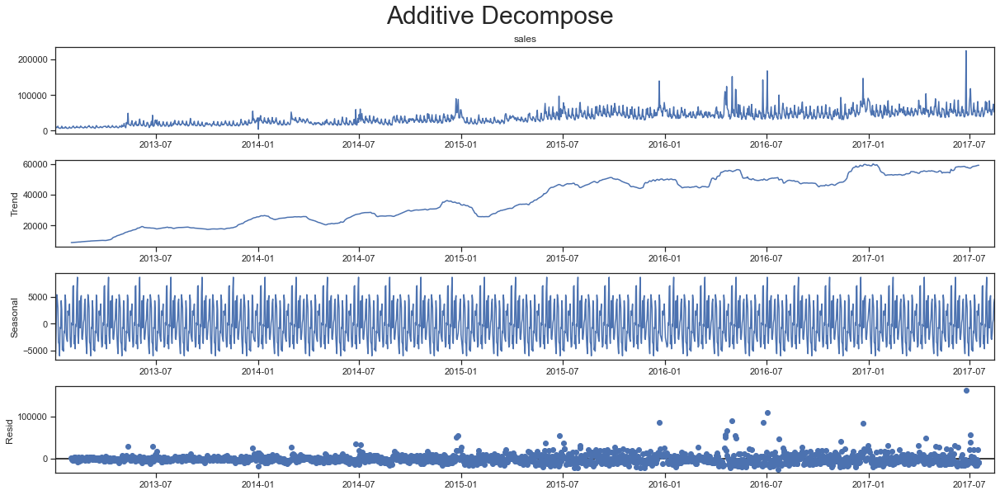

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
dfee=dfe.drop(columns=['onpromotion','transactions','Year','Month','Day','WeekOfYear'])
decompose_data = seasonal_decompose(dfee.sales, model="additive", filt=None, two_sided=True, extrapolate_trend=0, period=56)
# period 56 because 56 months
decompose_data.plot().suptitle('Additive Decompose', fontsize=30, y=1.04)

# Use the decomposed components to make a forecast for future data
forecast = decompose_data.trend + decompose_data.seasonal + decompose_data.resid
future_dates = pd.date_range(start='2015-05-01', periods=56, freq='M')
future_forecast = pd.DataFrame(data=forecast[:56].values, index=future_dates, columns=['Forecast'])

# Print the forecast for future data
print(future_forecast)

In [ ]:
from statsmodels.tsa.stattools import adfuller
dftest = adfuller(dfa.sales, autolag = 'AIC')
print("1. ADF : ",dftest[0])
print("2. P-Value : ", dftest[1])
print("3. Num Of Lags : ", dftest[2])
print("4. Num Of Observations Used For ADF Regression and Critical Values Calculation :", dftest[3])
print("5. Critical Values :")
for key, val in dftest[4].items():
    print("\t",key, ": ", val)

1. ADF :  -3.266590733505752
2. P-Value :  0.016439538764505043
3. Num Of Lags :  22
4. Num Of Observations Used For ADF Regression and Critical Values Calculation : 1654
5. Critical Values :
	 1% :  -3.4343097809950986
	 5% :  -2.8632890172254655
	 10% :  -2.5677011356149544


In [ ]:
from statsmodels.tsa.stattools import adfuller
dftest = adfuller(dfb.sales, autolag = 'AIC')
print("1. ADF : ",dftest[0])
print("2. P-Value : ", dftest[1])
print("3. Num Of Lags : ", dftest[2])
print("4. Num Of Observations Used For ADF Regression and Critical Values Calculation :", dftest[3])
print("5. Critical Values :")
for key, val in dftest[4].items():
    print("\t",key, ": ", val)

1. ADF :  -2.6869885587952527
2. P-Value :  0.07631700652605804
3. Num Of Lags :  25
4. Num Of Observations Used For ADF Regression and Critical Values Calculation : 1652
5. Critical Values :
	 1% :  -3.434314582398813
	 5% :  -2.8632911365771654
	 10% :  -2.5677022641423703


In [ ]:
from statsmodels.tsa.stattools import adfuller
dftest = adfuller(dfc.sales, autolag = 'AIC')
print("1. ADF : ",dftest[0])
print("2. P-Value : ", dftest[1])
print("3. Num Of Lags : ", dftest[2])
print("4. Num Of Observations Used For ADF Regression and Critical Values Calculation :", dftest[3])
print("5. Critical Values :")
for key, val in dftest[4].items():
    print("\t",key, ": ", val)

1. ADF :  -2.990986876690524
2. P-Value :  0.03574472879966485
3. Num Of Lags :  21
4. Num Of Observations Used For ADF Regression and Critical Values Calculation : 1656
5. Critical Values :
	 1% :  -3.434304991207054
	 5% :  -2.86328690299757
	 10% :  -2.5677000098164484


In [ ]:
from statsmodels.tsa.stattools import adfuller
dftest = adfuller(dfd.sales, autolag = 'AIC')
print("1. ADF : ",dftest[0])
print("2. P-Value : ", dftest[1])
print("3. Num Of Lags : ", dftest[2])
print("4. Num Of Observations Used For ADF Regression and Critical Values Calculation :", dftest[3])
print("5. Critical Values :")
for key, val in dftest[4].items():
    print("\t",key, ": ", val)

1. ADF :  -2.912329525679025
2. P-Value :  0.04393291281255599
3. Num Of Lags :  23
4. Num Of Observations Used For ADF Regression and Critical Values Calculation : 1658
5. Critical Values :
	 1% :  -3.434300212992577
	 5% :  -2.863284793874921
	 10% :  -2.567698886736967


In [ ]:
from statsmodels.tsa.stattools import adfuller
dftest = adfuller(dfe.sales, autolag = 'AIC')
print("1. ADF : ",dftest[0])
print("2. P-Value : ", dftest[1])
print("3. Num Of Lags : ", dftest[2])
print("4. Num Of Observations Used For ADF Regression and Critical Values Calculation :", dftest[3])
print("5. Critical Values :")
for key, val in dftest[4].items():
    print("\t",key, ": ", val)

1. ADF :  -2.2438904336747933
2. P-Value :  0.19070295810020566
3. Num Of Lags :  21
4. Num Of Observations Used For ADF Regression and Critical Values Calculation : 1656
5. Critical Values :
	 1% :  -3.434304991207054
	 5% :  -2.86328690299757
	 10% :  -2.5677000098164484



Aqui podemos ver que o valor-p é maior para nosso conjunto de dados e podemos dizer que a evidência da hipótese nula é baixa; portanto, a série temporal é não estacionária. Podemos tornar a série temporal estacionária com métodos diferenciais.

# ########################

                 Forecast
2015-05-31            NaN
2015-06-30            NaN
2015-07-31            NaN
2015-08-31            NaN
2015-09-30            NaN
2015-10-31            NaN
2015-11-30            NaN
2015-12-31            NaN
2016-01-31            NaN
2016-02-29            NaN
2016-03-31            NaN
2016-04-30            NaN
2016-05-31            NaN
2016-06-30            NaN
2016-07-31            NaN
2016-08-31            NaN
2016-09-30            NaN
2016-10-31            NaN
2016-11-30            NaN
2016-12-31            NaN
2017-01-31            NaN
2017-02-28            NaN
2017-03-31            NaN
2017-04-30            NaN
2017-05-31            NaN
2017-06-30            NaN
2017-07-31            NaN
2017-08-31            NaN
2017-09-30  264488.818076
2017-10-31  281061.127052
2017-11-30  271254.217996
2017-12-31  369402.055266
2018-01-31  518887.462705
2018-02-28  486336.820180
2018-03-31  344308.715017
2018-04-30  321245.839130
2018-05-31  321538.177149
2018-06-30  

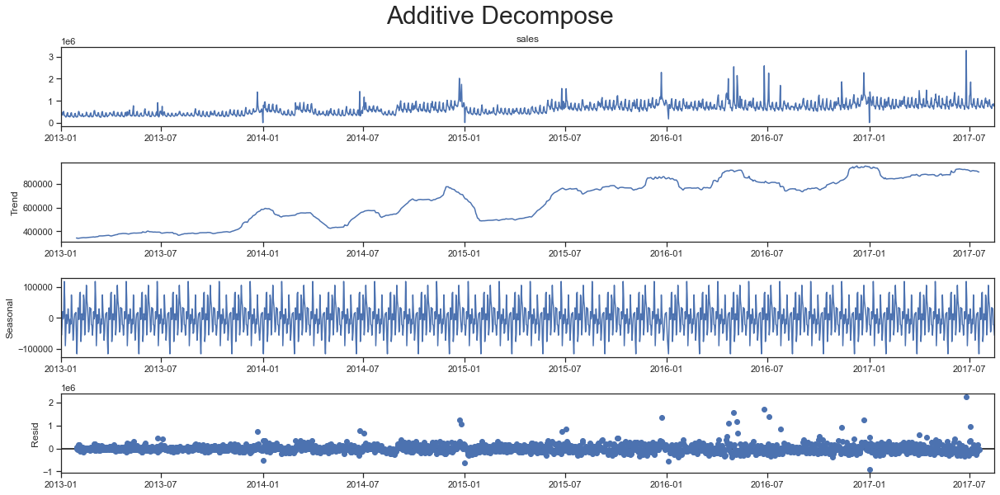

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
#ds=ds.drop(columns=['onpromotion','transactions'])
decompose_data = seasonal_decompose(ds.sales, model="additive", filt=None, two_sided=True, extrapolate_trend=0, period=56)
# period 56 because 56 months
decompose_data.plot().suptitle('Additive Decompose', fontsize=30, y=1.04)
# Use the decomposed components to make a forecast for future data
forecast = decompose_data.trend + decompose_data.seasonal + decompose_data.resid
future_dates = pd.date_range(start='2015-05-01', periods=56, freq='M')
future_forecast = pd.DataFrame(data=forecast[:56].values, index=future_dates, columns=['Forecast'])

# Print the forecast for future data
print(future_forecast)

In [ ]:
from statsmodels.tsa.stattools import adfuller
dftest = adfuller(ds.sales, autolag = 'AIC')
print("1. ADF : ",dftest[0])
print("2. P-Value : ", dftest[1])
print("3. Num Of Lags : ", dftest[2])
print("4. Num Of Observations Used For ADF Regression and Critical Values Calculation :", dftest[3])
print("5. Critical Values :")
for key, val in dftest[4].items():
    print("\t",key, ": ", val)

1. ADF :  -2.8318043131059456
2. P-Value :  0.053872395849961424
3. Num Of Lags :  22
4. Num Of Observations Used For ADF Regression and Critical Values Calculation : 1659
5. Critical Values :
	 1% :  -3.4342978282123258
	 5% :  -2.8632837412222885
	 10% :  -2.567698326213784


# Modelação

In [ ]:
import numpy as np
import pandas as pd
from scipy.stats import norm
import statsmodels.api as sm
import matplotlib.pyplot as plt
from datetime import datetime
import requests
from io import BytesIO
# Register converters to avoid warnings
pd.plotting.register_matplotlib_converters()
plt.rc("figure", figsize=(16,8))
plt.rc("font", size=14)

In [ ]:
exog_vars = dsw[['sales', 'transactions']]
train_data = df.loc['2015-08-01':'2017-08-01']
test_data = df.loc['2013-01-01':'2015-08-01']

In [ ]:
ds = df.copy(deep = True)

In [ ]:
ds

,store_id,product_type,sales,onpromotion,oil_price,holiday_type,local,holiday_city,holiday_desc,h_transferred,sotre_city,store_state,store_type,similiar_stores,transactions,Year,Month,day,WeekOfYear,Day
date,,,,,,,,,,,,,,,,,,,,
2013-01-01,25,AUTOMOTIVE,0.000,0,93.14,Holiday,National,Ecuador,Primer dia del ano,False,Salinas,Santa Elena,D,1,0.0,2013,1,1,1,1
2013-01-01,25,BABY CARE,0.000,0,93.14,Holiday,National,Ecuador,Primer dia del ano,False,Salinas,Santa Elena,D,1,0.0,2013,1,1,1,1
2013-01-01,25,BEAUTY,2.000,0,93.14,Holiday,National,Ecuador,Primer dia del ano,False,Salinas,Santa Elena,D,1,770.0,2013,1,1,1,1
2013-01-01,25,BEVERAGES,810.000,0,93.14,Holiday,National,Ecuador,Primer dia del ano,False,Salinas,Santa Elena,D,1,770.0,2013,1,1,1,1
2013-01-01,25,BOOKS,0.000,0,93.14,Holiday,National,Ecuador,Primer dia del ano,False,Salinas,Santa Elena,D,1,0.0,2013,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-08-15,9,POULTRY,438.133,0,47.57,Holiday,Local,Riobamba,Fundacion de Riobamba,False,Quito,Pichincha,B,6,2155.0,2017,8,15,33,15
2017-08-15,9,PREPARED FOODS,154.553,1,47.57,Holiday,Local,Riobamba,Fundacion de Riobamba,False,Quito,Pichincha,B,6,2155.0,2017,8,15,33,15
2017-08-15,9,PRODUCE,2419.729,148,47.57,Holiday,Local,Riobamba,Fundacion de Riobamba,False,Quito,Pichincha,B,6,2155.0,2017,8,15,33,15


# Correlações e Modelos



In [ ]:
!pip install darts

In [ ]:
from darts import TimeSeries
from darts.models import Prophet,RandomForest
from darts.dataprocessing.transformers import Scaler
from darts.metrics import mse,mae ,mape

In [ ]:
grouped_df =df.groupby('date')['sales','holiday_type','holiday_city','local'].sum()
data = grouped_df.reset_index()

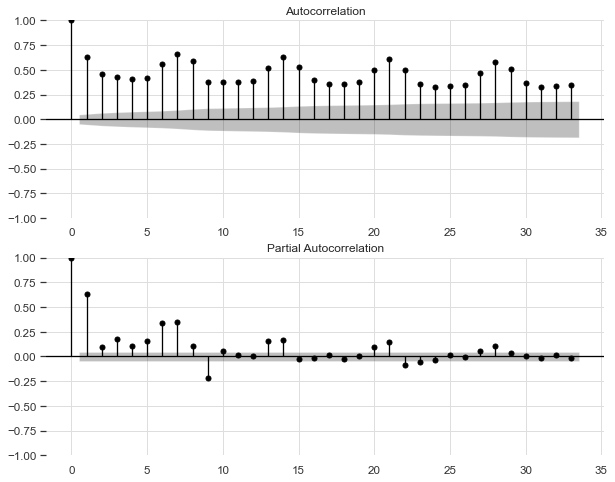

In [ ]:
fig, ax = plt.subplots(2, figsize=(10, 8))
plot_acf(data['sales'], ax=ax[0])
plot_pacf(data['sales'], ax=ax[1])
plt.show()

## Criação de metricas para calculo do erro

In [ ]:
def Evaluations(actual, predicted):
    # Calculating the mean absolute error
    mae_error = mae(actual, predicted)

    # Calculating the mean squared error
    mse_error = mse(actual, predicted)

    # Calculating the mean absolute percentage error
    mape_error = mape(actual, predicted)

    # Returning the errors
    return mae_error, mse_error, mape_error

# Prophet Model

In [ ]:
# Criar time series
series = TimeSeries.from_dataframe(data, 'date', 'sales',fill_missing_dates=True, freq='D')

# Train-test split
train, val = series.split_after(pd.Timestamp('2017-05-18'))

# Criar o Modelo em prophet
model = Prophet()

# Fit model
model.fit(train)

# Previsao 3 meses
prediction = model.predict(n=90)

22:56:20 - cmdstanpy - INFO - Chain [1] start processing
22:56:20 - cmdstanpy - INFO - Chain [1] done processing


In [ ]:
series = TimeSeries.from_dataframe(data, 'date', 'sales',fill_missing_dates=True, freq='D',fillna_value=True)

train, val = series.split_after(pd.Timestamp('2017-05-18'))

model = Prophet(seasonality_mode= 'multiplicative' ,
    changepoint_prior_scale=0.5,
    holidays_prior_scale=0.5,
    seasonality_prior_scale=100,
    changepoint_range=0.8,
    # yearly_seasonality=True,
    weekly_seasonality=True,
    daily_seasonality=True,
    #country_holidays='Ecuador',
    add_encoders={
    'cyclic': {'future': ['month']},
    'datetime_attribute': {'future': ['hour', 'dayofweek']},
    'position': {'future': ['relative']},
    'custom': {'future': [lambda idx: (idx.year - 1950) / 50]},
    'transformer': Scaler()}
    )

# Fit model
model.fit(train)

22:56:21 - cmdstanpy - INFO - Chain [1] start processing
22:56:23 - cmdstanpy - INFO - Chain [1] done processing


In [ ]:
#as imagens não estão a ser salvas depois de guardar o notebook
import plotly.graph_objs as go

# Forecast 3 meses
prediction = model.predict(n=90)

fig = go.Figure()



fig.add_trace(go.Scatter(x=train.pd_dataframe().index,
                        y=train.pd_series().values,
                        name='training data',
                        mode='lines+markers'))

fig.add_trace(go.Scatter(x=prediction.pd_dataframe().index,
                        y=prediction.pd_series().values,
                        name='Prediction',
                        mode='lines+markers'))


fig.add_trace(go.Scatter(x=val.pd_dataframe().index,
                        y=val.pd_series().values,
                        name='Actual',
                        mode='lines+markers'))



fig.update_xaxes(title_text='Tempo')

fig.update_yaxes(title_text='Sales' )

fig.update_layout(title='Sales Forecasting Prophet ',
                    height=500,
                    width=1800)

fig.show()


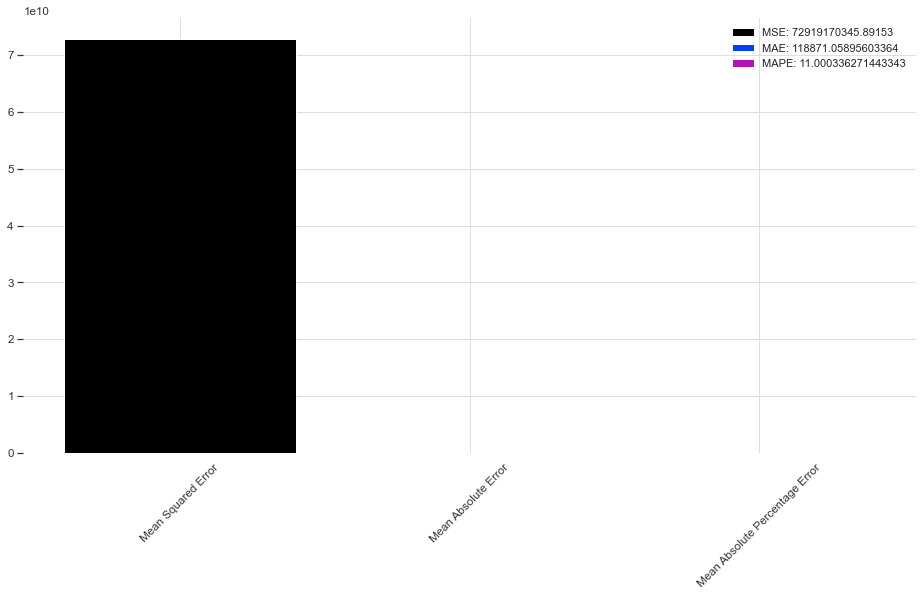

In [ ]:
# Evaluating the model
MAE, MSE, MAPE = Evaluations(val, prediction)

# Plotting the errors
plt.bar('Mean Squared Error', MSE)
plt.bar('Mean Absolute Error', MAE)
plt.bar('Mean Absolute Percentage Error', MAPE)

# Rotating the x-axis labels
plt.xticks(rotation=45)

# Adding legend to the plot
plt.legend(['MSE: '+str(MSE), 'MAE: '+str(MAE), 'MAPE: '+str(MAPE)])

# Displaying the plot
plt.show()

In [ ]:
#as imagens não estão a ser salvas depois de guardar o notebook
series = TimeSeries.from_dataframe(data, 'date', 'sales',fill_missing_dates=True, freq='D',fillna_value=True)


model = Prophet()

model.fit(series)

prediction = model.predict(n=90)

import plotly.graph_objs as go

fig = go.Figure()



fig.add_trace(go.Scatter(x=series.pd_dataframe().index,
                        y=series.pd_series().values,
                        name='training data',
                        mode='lines+markers'))

fig.add_trace(go.Scatter(x=prediction.pd_dataframe().index,
                        y=prediction.pd_series().values,
                        name='Prediction',
                        mode='lines+markers'))






fig.update_xaxes(title_text='Tempo')

fig.update_yaxes(title_text='Sales' )

fig.update_layout(title='Sales Forecasting para 3 meses Prophet',
                    height=500,
                    width=1800)

fig.show()


22:56:24 - cmdstanpy - INFO - Chain [1] start processing
22:56:25 - cmdstanpy - INFO - Chain [1] done processing


In [ ]:
#as imagens não estão a ser salvas depois de guardar o notebook
series = TimeSeries.from_dataframe(data, 'date', 'sales',fill_missing_dates=True, freq='D',fillna_value=True)


model = Prophet()

model.fit(series)

prediction = model.predict(n=720)

import plotly.graph_objs as go

fig = go.Figure()



fig.add_trace(go.Scatter(x=series.pd_dataframe().index,
                        y=series.pd_series().values,
                        name='training data',
                        mode='lines+markers'))

fig.add_trace(go.Scatter(x=prediction.pd_dataframe().index,
                        y=prediction.pd_series().values,
                        name='Prediction',
                        mode='lines+markers'))






fig.update_xaxes(title_text='Tempo')

fig.update_yaxes(title_text='Sales' )

fig.update_layout(title='Sales Forecasting para 2 anos Prophet',
                    height=500,
                    width=1800)

fig.show()

22:56:25 - cmdstanpy - INFO - Chain [1] start processing
22:56:26 - cmdstanpy - INFO - Chain [1] done processing


## Random Forest

In [ ]:
series = TimeSeries.from_dataframe(data, 'date', 'sales',fill_missing_dates=True, freq='D',fillna_value=True)

train, val = series.split_after(pd.Timestamp('2017-05-18'))

model = RandomForest(lags=12,
                    output_chunk_length=12)

model.fit(train)

# Forecast 3 meses
prediction = model.predict(n=90)

In [ ]:
#as imagens que usam o plotly não estão a ser salvas depois de guardar o notebook
import plotly.graph_objs as go

fig = go.Figure()



fig.add_trace(go.Scatter(x=train.pd_dataframe().index,
                        y=train.pd_series().values,
                        name='training data',
                        mode='lines+markers'))

fig.add_trace(go.Scatter(x=prediction.pd_dataframe().index,
                        y=prediction.pd_series().values,
                        name='Prediction',
                        mode='lines+markers'))


fig.add_trace(go.Scatter(x=val.pd_dataframe().index,
                        y=val.pd_series().values,
                        name='Actual',
                        mode='lines+markers'))



fig.update_xaxes(title_text='Tempo')

fig.update_yaxes(title_text='Sales' )

fig.update_layout(title='Sales Forecasting Prediction vs Actual Random Forest',
                    height=500,
                    width=1800)

fig.show()


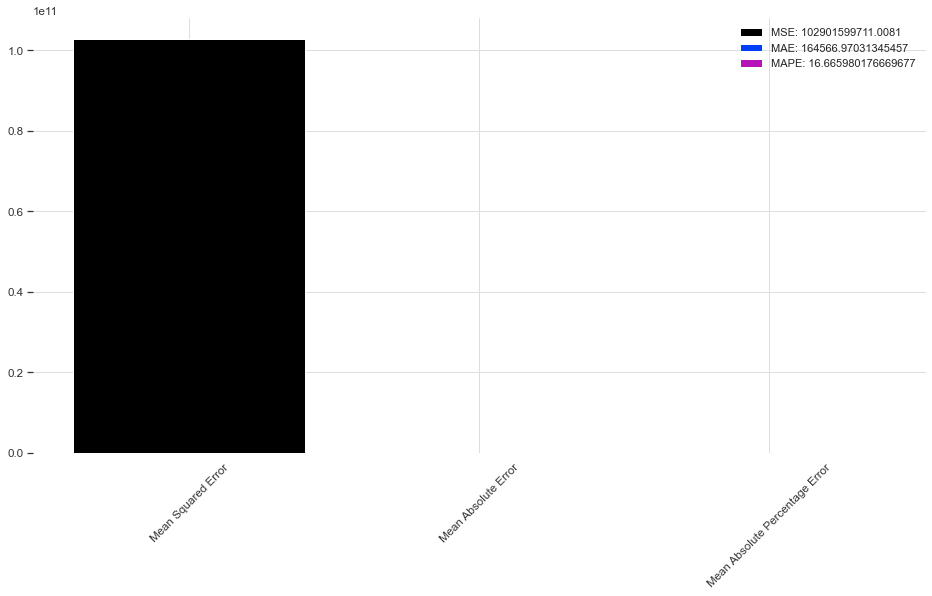

In [ ]:
# Evaluating the model
MAE, MSE, MAPE = Evaluations(val, prediction)

# Plotting the errors
plt.bar('Mean Squared Error', MSE)
plt.bar('Mean Absolute Error', MAE)
plt.bar('Mean Absolute Percentage Error', MAPE)

# Rotating the x-axis labels
plt.xticks(rotation=45)

# Adding legend to the plot
plt.legend(['MSE: '+str(MSE), 'MAE: '+str(MAE), 'MAPE: '+str(MAPE)])

# Displaying the plot
plt.show()

In [ ]:
#as imagens não estão a ser salvas depois de guardar o notebook
series = TimeSeries.from_dataframe(data, 'date', 'sales',fill_missing_dates=True, freq='D',fillna_value=True)

model = RandomForest(lags=12,
                    output_chunk_length=12)

model.fit(series)

prediction = model.predict(n=90)



import plotly.graph_objs as go

fig = go.Figure()



fig.add_trace(go.Scatter(x=series.pd_dataframe().index,
                        y=series.pd_series().values,
                        name='training data',
                        mode='lines+markers'))

fig.add_trace(go.Scatter(x=prediction.pd_dataframe().index,
                        y=prediction.pd_series().values,
                        name='Prediction',
                        mode='lines+markers'))





fig.update_xaxes(title_text='Tempo')


fig.update_yaxes(title_text='Sales' )

fig.update_layout(title='Sales Forecasting 3 meses Random Forest',
                    height=500,
                    width=1800)

fig.show()


In [ ]:
#as imagens não estão a ser salvas depois de guardar o notebook
series = TimeSeries.from_dataframe(data, 'date', 'sales',fill_missing_dates=True, freq='D',fillna_value=True)

model = RandomForest(lags=12,
                    output_chunk_length=12)

model.fit(series)

# Forecast 2 anos
prediction = model.predict(n=720)



import plotly.graph_objs as go

fig = go.Figure()



fig.add_trace(go.Scatter(x=series.pd_dataframe().index,
                        y=series.pd_series().values,
                        name='training data',
                        mode='lines+markers'))

fig.add_trace(go.Scatter(x=prediction.pd_dataframe().index,
                        y=prediction.pd_series().values,
                        name='Prediction',
                        mode='lines+markers'))





fig.update_xaxes(title_text='Tempo')

fig.update_yaxes(title_text='Sales' )

fig.update_layout(title='Sales Forecasting 2 anos usando RandomForest Model ',
                    height=500,
                    width=1800)

fig.show()


## Prophet com os nulos comparação

In [ ]:
df_null = pd.read_csv("hw2.csv",parse_dates=True,index_col='date')

In [ ]:
grouped_df =df_null.groupby('date')['sales','holiday_type','holiday_city','local'].sum()
data = grouped_df.reset_index()

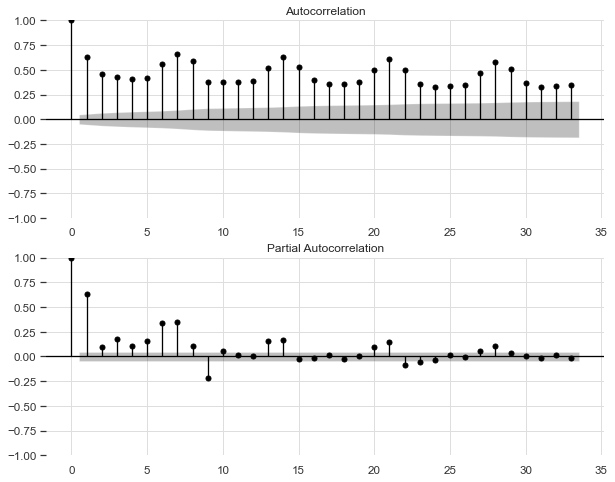

In [ ]:
fig, ax = plt.subplots(2, figsize=(10, 8))
plot_acf(data['sales'], ax=ax[0])
plot_pacf(data['sales'], ax=ax[1])
plt.show()

In [ ]:
# Criar time series
series = TimeSeries.from_dataframe(data, 'date', 'sales',fill_missing_dates=True, freq='D')

# Train-test split
train, val = series.split_after(pd.Timestamp('2017-05-18'))

# Criar o Modelo em prophet
model = Prophet()

# Fit model
model.fit(train)

# Previsao 3 meses
prediction = model.predict(n=90)


23:02:24 - cmdstanpy - INFO - Chain [1] start processing
23:02:24 - cmdstanpy - INFO - Chain [1] done processing


In [ ]:
models = Prophet(interval_width = 0.95)
models.fit(train)

23:02:39 - cmdstanpy - INFO - Chain [1] start processing
23:02:39 - cmdstanpy - INFO - Chain [1] done processing


In [ ]:
#as imagens não estão a ser salvas depois de guardar o notebook
import plotly.graph_objs as go

fig = go.Figure()



fig.add_trace(go.Scatter(x=train.pd_dataframe().index,
                        y=train.pd_series().values,
                        name='training data',
                        mode='lines+markers'))

fig.add_trace(go.Scatter(x=prediction.pd_dataframe().index,
                        y=prediction.pd_series().values,
                        name='Prediction',
                        mode='lines+markers'))


fig.add_trace(go.Scatter(x=val.pd_dataframe().index,
                        y=val.pd_series().values,
                        name='Actual',
                        mode='lines+markers'))




fig.update_xaxes(title_text='Tempo')


fig.update_yaxes(title_text='Sales' )

fig.update_layout(title='Sales Forecasting',
                    height=500,
                    width=1800)

# fig.show()


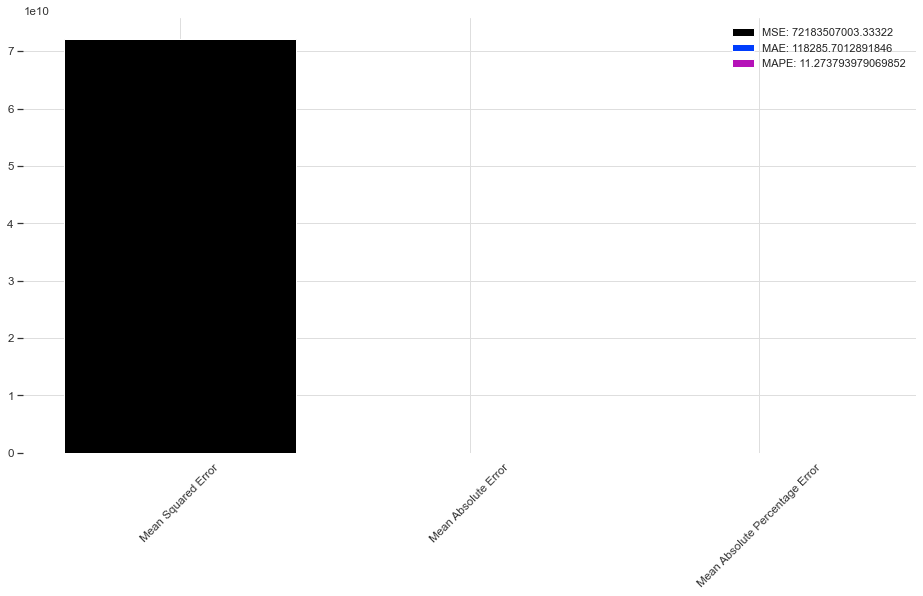

In [ ]:
# Evaluating the model
MAE, MSE, MAPE = Evaluations(val, prediction)

# Plotting the errors
plt.bar('Mean Squared Error', MSE)
plt.bar('Mean Absolute Error', MAE)
plt.bar('Mean Absolute Percentage Error', MAPE)

# Rotating the x-axis labels
plt.xticks(rotation=45)

# Adding legend to the plot
plt.legend(['MSE: '+str(MSE), 'MAE: '+str(MAE), 'MAPE: '+str(MAPE)])

# Displaying the plot
plt.show()

## SARIMAX

In [ ]:
df[df.sales==0]

,store_id,product_type,sales,onpromotion,oil_price,holiday_type,local,holiday_city,holiday_desc,h_transferred,sotre_city,store_state,store_type,similiar_stores,transactions,Year,Month,day,WeekOfYear,Day
date,,,,,,,,,,,,,,,,,,,,
2013-01-01,25,AUTOMOTIVE,0.0,0,93.14,Holiday,National,Ecuador,Primer dia del ano,False,Salinas,Santa Elena,D,1,0.0,2013,1,1,1,1
2013-01-01,25,BABY CARE,0.0,0,93.14,Holiday,National,Ecuador,Primer dia del ano,False,Salinas,Santa Elena,D,1,0.0,2013,1,1,1,1
2013-01-01,25,BOOKS,0.0,0,93.14,Holiday,National,Ecuador,Primer dia del ano,False,Salinas,Santa Elena,D,1,0.0,2013,1,1,1,1
2013-01-01,25,CELEBRATION,0.0,0,93.14,Holiday,National,Ecuador,Primer dia del ano,False,Salinas,Santa Elena,D,1,0.0,2013,1,1,1,1
2013-01-01,25,HARDWARE,0.0,0,93.14,Holiday,National,Ecuador,Primer dia del ano,False,Salinas,Santa Elena,D,1,0.0,2013,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-08-15,8,HOME APPLIANCES,0.0,0,47.57,Holiday,Local,Riobamba,Fundacion de Riobamba,False,Quito,Pichincha,D,8,0.0,2017,8,15,33,15
2017-08-15,8,SCHOOL AND OFFICE SUPPLIES,0.0,0,47.57,Holiday,Local,Riobamba,Fundacion de Riobamba,False,Quito,Pichincha,D,8,0.0,2017,8,15,33,15
2017-08-15,9,BABY CARE,0.0,0,47.57,Holiday,Local,Riobamba,Fundacion de Riobamba,False,Quito,Pichincha,B,6,0.0,2017,8,15,33,15


## Prediction

In [ ]:
treino = df
treino = treino.groupby(['date']).sales.sum().reset_index()

treino = treino.set_index('date')
treino

,sales
date,
2013-01-01,2511.618999
2013-01-02,496092.417944
2013-01-03,361461.231124
2013-01-04,354459.677093
2013-01-05,477350.121229
...,...
2017-08-11,826373.722022
2017-08-12,792630.535079
2017-08-13,865639.677471


In [ ]:
df

,store_id,product_type,sales,onpromotion,oil_price,holiday_type,local,holiday_city,holiday_desc,h_transferred,sotre_city,store_state,store_type,similiar_stores,transactions,Year,Month,day,WeekOfYear,Day
date,,,,,,,,,,,,,,,,,,,,
2013-01-01,25,AUTOMOTIVE,0.000,0,93.14,Holiday,National,Ecuador,Primer dia del ano,False,Salinas,Santa Elena,D,1,0.0,2013,1,1,1,1
2013-01-01,25,BABY CARE,0.000,0,93.14,Holiday,National,Ecuador,Primer dia del ano,False,Salinas,Santa Elena,D,1,0.0,2013,1,1,1,1
2013-01-01,25,BEAUTY,2.000,0,93.14,Holiday,National,Ecuador,Primer dia del ano,False,Salinas,Santa Elena,D,1,770.0,2013,1,1,1,1
2013-01-01,25,BEVERAGES,810.000,0,93.14,Holiday,National,Ecuador,Primer dia del ano,False,Salinas,Santa Elena,D,1,770.0,2013,1,1,1,1
2013-01-01,25,BOOKS,0.000,0,93.14,Holiday,National,Ecuador,Primer dia del ano,False,Salinas,Santa Elena,D,1,0.0,2013,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-08-15,9,POULTRY,438.133,0,47.57,Holiday,Local,Riobamba,Fundacion de Riobamba,False,Quito,Pichincha,B,6,2155.0,2017,8,15,33,15
2017-08-15,9,PREPARED FOODS,154.553,1,47.57,Holiday,Local,Riobamba,Fundacion de Riobamba,False,Quito,Pichincha,B,6,2155.0,2017,8,15,33,15
2017-08-15,9,PRODUCE,2419.729,148,47.57,Holiday,Local,Riobamba,Fundacion de Riobamba,False,Quito,Pichincha,B,6,2155.0,2017,8,15,33,15


In [ ]:
import statsmodels.api as sm

model = sm.tsa.SARIMAX(endog=treino['sales'], order=(1, 0, 0), seasonal_order=(1, 1, 1, 12))

results = model.fit()

results.summary()

d:\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

d:\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                       
============================================================================================
Dep. Variable:                                sales   No. Observations:                 1682
Model:             SARIMAX(1, 0, 0)x(1, 1, [1], 12)   Log Likelihood              -22958.732
Date:                              Fri, 31 Mar 2023   AIC                          45925.464
Time:                                      22:56:40   BIC                          45947.146
Sample:                                           0   HQIC                         45933.498
                                             - 1682                                         
Covariance Type:                                opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4373      0.022     20.058      0.000       0.395       0.480
ar.S.L12      -0.1407      0.061     -2.315      0.021      -0.260      -0.022
ma.S.L12      -0.9077      0.027    -34.143      0.000      -0.960      -0.856
sigma2      8.516e+10   4.57e-13   1.86e+23      0.000    8.52e+10    8.52e+10
===================================================================================
Ljung-Box (L1) (Q):                   0.25   Jarque-Bera (JB):             45705.78
Prob(Q):                              0.62   Prob(JB):                         0.00
Heteroskedasticity (H):               4.15   Skew:                             2.94
Prob(H) (two-sided):                  0.00   Kurtosis:                        27.94
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 3.47e+39. Standard errors may be unstable.
"""

<AxesSubplot:xlabel='date'>

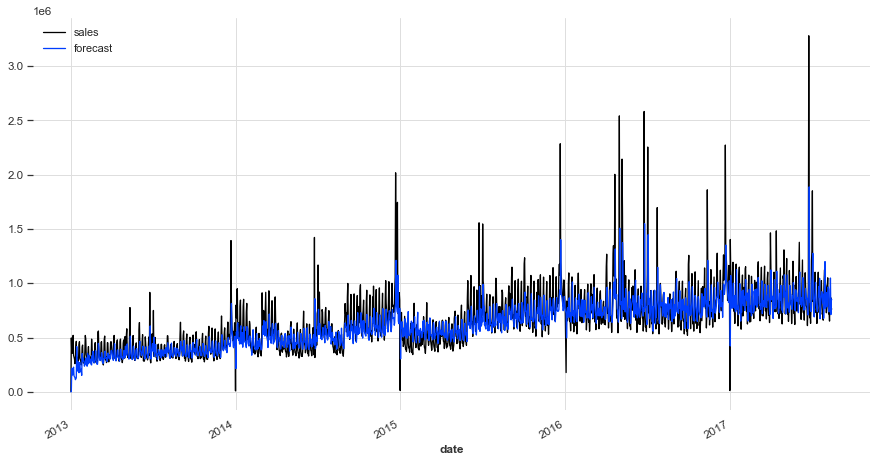

In [ ]:
treino['forecast']=results.predict(start=0, end=-1)
treino[['sales','forecast']].plot(figsize=(15,8))

In [ ]:
from statsmodels.tsa.api import SARIMAX
fcast = results.get_forecast(30)
fc = fcast.predicted_mean
se = fcast.se_mean
conf_99 = fcast.conf_int(alpha=0.01)

results.simulate(30, anchor='start')

d:\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.



date
2013-01-01   -1.211773e+05
2013-01-02    1.841167e+05
2013-01-03   -1.325611e+05
2013-01-04   -3.815872e+05
2013-01-05   -6.232473e+05
2013-01-06   -1.128023e+06
2013-01-07   -4.111727e+05
2013-01-08   -8.158152e+05
2013-01-09   -2.764216e+05
2013-01-10    2.237302e+05
2013-01-11    7.492808e+05
2013-01-12    1.102895e+06
2013-01-13    2.169048e+05
2013-01-14    5.086981e+05
2013-01-15    3.114343e+05
2013-01-16   -1.288266e+05
2013-01-17   -8.298904e+05
2013-01-18   -4.745860e+05
2013-01-19   -1.444191e+05
2013-01-20   -4.766816e+05
2013-01-21   -4.655965e+05
2013-01-22   -4.953275e+05
2013-01-23   -3.327574e+04
2013-01-24   -3.038192e+04
2013-01-25    1.279697e+05
2013-01-26    4.738708e+05
2013-01-27   -1.277051e+05
2013-01-28   -1.750558e+05
2013-01-29   -8.036839e+05
2013-01-30   -6.657089e+05
Name: sales, dtype: float64

## Future Forecast

In [ ]:
future_dates = pd.date_range(start='2017-06-02', end='2017-08-30')
future_df = pd.DataFrame({'date': future_dates, 'sales': np.nan,'onpromotion':'onpromotion_1','oil_price':'oil_price1'})
extended_treino = pd.concat([treino, future_df])
extended_treino.set_index('date', inplace=True)

In [ ]:
model = sm.tsa.SARIMAX(endog=extended_treino['sales'], order=(1, 0, 0), seasonal_order=(1, 1, 1, 4))
results = model.fit()

# predict for the future dates
future_forecast = results.predict(start=future_dates[0], end=future_dates[-1])

print(future_forecast)

d:\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

d:\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

A date index has been provided, but it is not monotonic and so will be ignored when e.g. forecasting.

d:\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

d:\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

A date index has been provided, but it is not monotonic and so will be ignored when e.g. forecasting.



date
2017-06-02    913400.773044
2017-06-03    839684.560787
2017-06-04    858466.313939
2017-06-05    860830.098294
2017-06-06    940799.891747
                  ...      
2017-08-26    853976.294289
2017-08-27    857243.058284
2017-08-28    856590.733463
2017-08-29    939789.456628
2017-08-30    853976.294289
Name: predicted_mean, Length: 90, dtype: float64


## ERROR

In [ ]:
from sklearn.metrics import mean_squared_error

In [ ]:
np.sqrt(mean_squared_error(treino['sales'],treino.forecast))

202948.998228608